In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%matplotlib notebook

In [ ]:
# import the necessary packages
from collections import namedtuple
import numpy as np
import cv2

In [ ]:
# define the `Detection` object
Detection = namedtuple("Detection", ["image_path", "gt", "pred"])

In [ ]:
def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

In [ ]:
def bb_dice(boxA, boxB):
  #determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	dice = (2*(interArea)) / float(boxAArea + boxBArea)
	# return the intersection over union value
	return dice

In [ ]:
import pandas as pd

In [ ]:
usecols = ['filename', 'xmin', 'ymin', 'xmax', 'ymax']

In [ ]:
gtdata = pd.read_csv("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/training_demo/annotations/test_labels.csv",usecols=usecols)
gtdata

,filename,xmin,ymin,xmax,ymax
0,14_007_3_0035.bmp,391,181,444,221
1,14_007_3_0030.bmp,419,203,458,242
2,14_007_3_0031.bmp,415,190,461,234
3,14_006_1_0146.bmp,503,388,589,528
4,14_006_1_0149.bmp,484,412,574,529
5,14_006_1_0152.bmp,480,405,574,544
6,14_007_3_0032.bmp,426,183,460,230
7,14_007_3_0037.bmp,399,178,440,223
8,14_006_1_0145.bmp,509,403,589,542
9,14_006_1_0148.bmp,492,403,586,536


In [ ]:
filenames = gtdata.iloc[:,0]
filenames

0     14_007_3_0035.bmp
1     14_007_3_0030.bmp
2     14_007_3_0031.bmp
3     14_006_1_0146.bmp
4     14_006_1_0149.bmp
5     14_006_1_0152.bmp
6     14_007_3_0032.bmp
7     14_007_3_0037.bmp
8     14_006_1_0145.bmp
9     14_006_1_0148.bmp
10    14_006_1_0151.bmp
11    14_006_1_0143.bmp
12    14_007_3_0029.bmp
13    14_006_1_0150.bmp
14    14_007_3_0038.bmp
15    14_007_3_0033.bmp
16    14_007_3_0036.bmp
17    14_007_3_0034.bmp
18    14_006_1_0147.bmp
19    14_006_1_0144.bmp
Name: filename, dtype: object

In [ ]:
myfilenamesarr = pd.array(filenames)
myfilenamesarr

<PandasArray>
['14_007_3_0035.bmp', '14_007_3_0030.bmp', '14_007_3_0031.bmp',
 '14_006_1_0146.bmp', '14_006_1_0149.bmp', '14_006_1_0152.bmp',
 '14_007_3_0032.bmp', '14_007_3_0037.bmp', '14_006_1_0145.bmp',
 '14_006_1_0148.bmp', '14_006_1_0151.bmp', '14_006_1_0143.bmp',
 '14_007_3_0029.bmp', '14_006_1_0150.bmp', '14_007_3_0038.bmp',
 '14_007_3_0033.bmp', '14_007_3_0036.bmp', '14_007_3_0034.bmp',
 '14_006_1_0147.bmp', '14_006_1_0144.bmp']
Length: 20, dtype: object

In [ ]:
xmins = gtdata.iloc[:,1]
xminsarr = pd.array(xmins)
xminsarr

<PandasArray>
[391, 419, 415, 503, 484, 480, 426, 399, 509, 492, 485, 510, 435, 473, 403,
 401, 389, 390, 505, 493]
Length: 20, dtype: int64

In [ ]:
ymins = gtdata.iloc[:,2]
yminsarr = pd.array(ymins)
yminsarr

<PandasArray>
[181, 203, 190, 388, 412, 405, 183, 178, 403, 403, 413, 419, 213, 396, 177,
 172, 181, 175, 397, 399]
Length: 20, dtype: int64

In [ ]:
xmaxs = gtdata.iloc[:,3]
xmaxsarr = pd.array(xmaxs)
xmaxsarr

<PandasArray>
[444, 458, 461, 589, 574, 574, 460, 440, 589, 586, 574, 592, 470, 579, 444,
 448, 431, 452, 589, 592]
Length: 20, dtype: int64

In [ ]:
ymaxs = gtdata.iloc[:,4]
ymaxsarr = pd.array(ymaxs)
ymaxsarr

<PandasArray>
[221, 242, 234, 528, 529, 544, 230, 223, 542, 536, 535, 541, 250, 536, 220,
 223, 216, 225, 527, 525]
Length: 20, dtype: int64

In [ ]:
# Creating coordinates list
coordinates = list(zip(xminsarr, yminsarr, xmaxsarr, ymaxsarr))

# Printing the result
print(coordinates)


[(391, 181, 444, 221), (419, 203, 458, 242), (415, 190, 461, 234), (503, 388, 589, 528), (484, 412, 574, 529), (480, 405, 574, 544), (426, 183, 460, 230), (399, 178, 440, 223), (509, 403, 589, 542), (492, 403, 586, 536), (485, 413, 574, 535), (510, 419, 592, 541), (435, 213, 470, 250), (473, 396, 579, 536), (403, 177, 444, 220), (401, 172, 448, 223), (389, 181, 431, 216), (390, 175, 452, 225), (505, 397, 589, 527), (493, 399, 592, 525)]


In [ ]:
# Creating a list of Detection tuples
examples = [tuple([filename] + list(coords)) for filename, coords in zip(myfilenamesarr, coordinates)]

# Printing the result
print(examples)


[('14_007_3_0035.bmp', 391, 181, 444, 221), ('14_007_3_0030.bmp', 419, 203, 458, 242), ('14_007_3_0031.bmp', 415, 190, 461, 234), ('14_006_1_0146.bmp', 503, 388, 589, 528), ('14_006_1_0149.bmp', 484, 412, 574, 529), ('14_006_1_0152.bmp', 480, 405, 574, 544), ('14_007_3_0032.bmp', 426, 183, 460, 230), ('14_007_3_0037.bmp', 399, 178, 440, 223), ('14_006_1_0145.bmp', 509, 403, 589, 542), ('14_006_1_0148.bmp', 492, 403, 586, 536), ('14_006_1_0151.bmp', 485, 413, 574, 535), ('14_006_1_0143.bmp', 510, 419, 592, 541), ('14_007_3_0029.bmp', 435, 213, 470, 250), ('14_006_1_0150.bmp', 473, 396, 579, 536), ('14_007_3_0038.bmp', 403, 177, 444, 220), ('14_007_3_0033.bmp', 401, 172, 448, 223), ('14_007_3_0036.bmp', 389, 181, 431, 216), ('14_007_3_0034.bmp', 390, 175, 452, 225), ('14_006_1_0147.bmp', 505, 397, 589, 527), ('14_006_1_0144.bmp', 493, 399, 592, 525)]


In [ ]:
# Transforming tuples to the required format
filenameandgtruths = [(filename, [x, y, w, h]) for filename, x, y, w, h in examples]

# Printing the result
print(filenameandgtruths)

[('14_007_3_0035.bmp', [391, 181, 444, 221]), ('14_007_3_0030.bmp', [419, 203, 458, 242]), ('14_007_3_0031.bmp', [415, 190, 461, 234]), ('14_006_1_0146.bmp', [503, 388, 589, 528]), ('14_006_1_0149.bmp', [484, 412, 574, 529]), ('14_006_1_0152.bmp', [480, 405, 574, 544]), ('14_007_3_0032.bmp', [426, 183, 460, 230]), ('14_007_3_0037.bmp', [399, 178, 440, 223]), ('14_006_1_0145.bmp', [509, 403, 589, 542]), ('14_006_1_0148.bmp', [492, 403, 586, 536]), ('14_006_1_0151.bmp', [485, 413, 574, 535]), ('14_006_1_0143.bmp', [510, 419, 592, 541]), ('14_007_3_0029.bmp', [435, 213, 470, 250]), ('14_006_1_0150.bmp', [473, 396, 579, 536]), ('14_007_3_0038.bmp', [403, 177, 444, 220]), ('14_007_3_0033.bmp', [401, 172, 448, 223]), ('14_007_3_0036.bmp', [389, 181, 431, 216]), ('14_007_3_0034.bmp', [390, 175, 452, 225]), ('14_006_1_0147.bmp', [505, 397, 589, 527]), ('14_006_1_0144.bmp', [493, 399, 592, 525])]


In [ ]:
len(filenameandgtruths)

20

Loading model...Done! Took 46.05798578262329 seconds
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0035.bmp... Done
Final box value:
[]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0030.bmp... Done
Final box value:
[]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0031.bmp... Done
Final box value:
[]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_006_1_0146.bmp... Done
Final box value:
[[506.8099021911621, 593.1756973266602, 398.98462295532227, 535.4317665100098]]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/tr

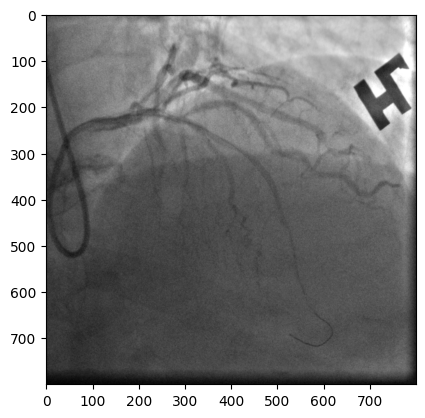

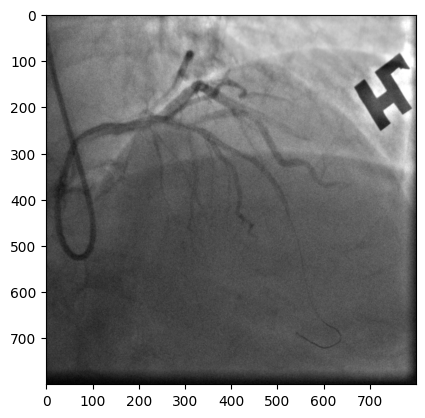

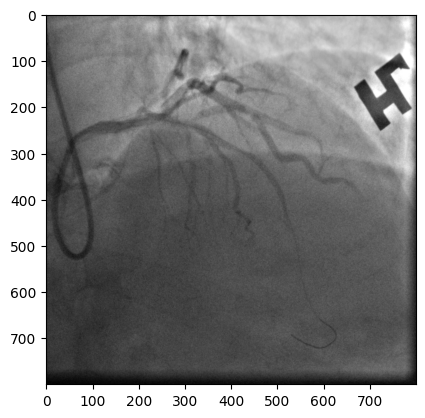

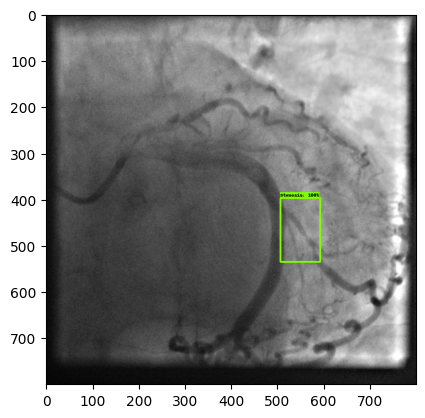

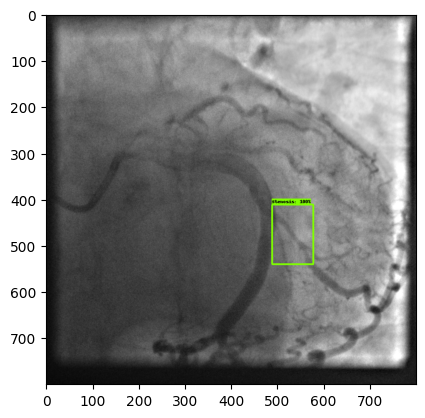

...

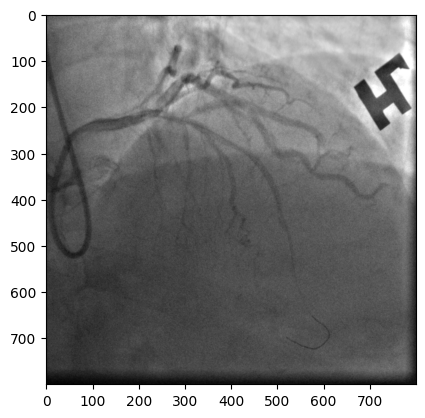

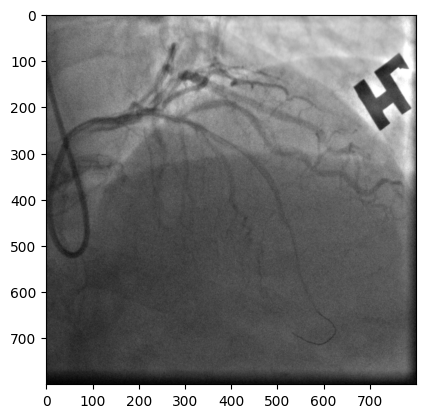

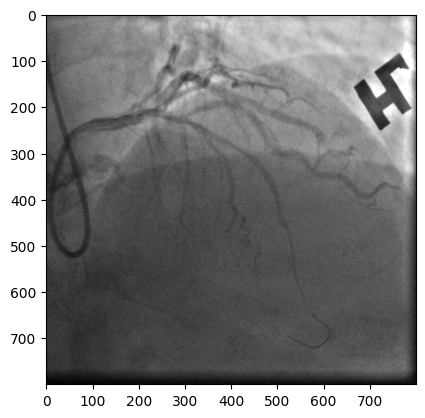

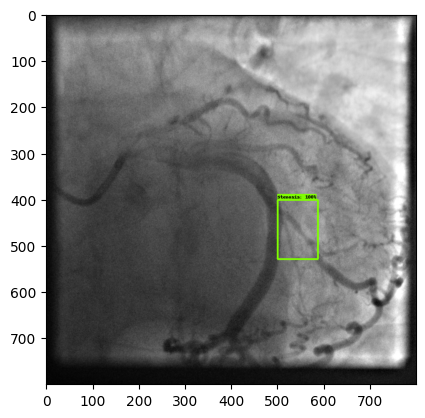

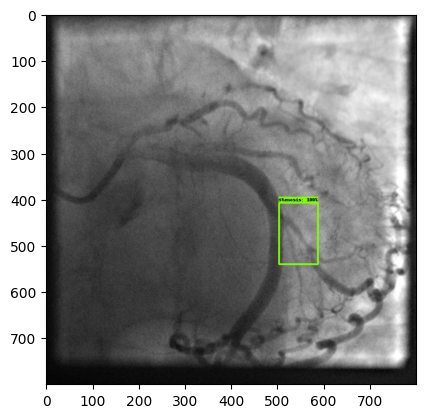

In [ ]:
#!/usr/bin/env python
# coding: utf-8
"""
Object Detection From TF2 Saved Model
=====================================
"""

# %%
# This demo will take you through the steps of running an "out-of-the-box" TensorFlow 2 compatible
# detection model on a collection of images. More specifically, in this example we will be using
# the `Saved Model Format <https://www.tensorflow.org/guide/saved_model>`__ to load the model.

# %%
# Download the test images
# ~~~~~~~~~~~~~~~~~~~~~~~~
# First we will download the images that we will use throughout this tutorial. The code snippet
# shown bellow will download the test images from the `TensorFlow Model Garden <https://github.com/tensorflow/models/tree/master/research/object_detection/test_images>`_
# and save them inside the ``data/images`` folder.
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf

tf.get_logger().setLevel('ERROR')           # Suppress TensorFlow logging (2)


# %%
# Load the model
# ~~~~~~~~~~~~~~
# Next we load the downloaded model
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_MODEL_DIR = '/content/drive/MyDrive/exportedmodels/my_effdetD2'
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# %%
# Load label map data (for plotting)
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# Label maps correspond index numbers to category names, so that when our convolution network
# predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility
# functions, but anything that returns a dictionary mapping integers to appropriate string labels
# would be fine.
PATH_TO_LABELS = '/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

# %%
# Putting everything together
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~
# The code shown below loads an image, runs it through the detection model and visualizes the
# detection results, including the keypoints.
#
# Note that this will take a long time (several minutes) the first time you run this code due to
# tf.function's trace-compilation --- on subsequent runs (e.g. on new images), things will be
# faster.
#
# Here are some simple things to try out if you are curious:
#
# * Modify some of the input images and see if detection still works. Some simple things to try out here (just uncomment the relevant portions of code) include flipping the image horizontally, or converting to grayscale (note that we still expect the input image to have 3 channels).
# * Print out `detections['detection_boxes']` and try to match the box locations to the boxes in the image.  Notice that coordinates are given in normalized form (i.e., in the interval [0, 1]).
# * Set ``min_score_thresh`` to other values (between 0 and 1) to allow more detections in or to filter out more detections.
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))


IMAGE_PATHS = '/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/'



from matplotlib import pyplot as plt
import cv2
%matplotlib inline

final_boxes_list = []  # Create an empty list to store all final box values

for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    im_width, im_height = (Image.open(image_path).size)
    image_np = load_image_into_numpy_array(image_path)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.30,
          agnostic_mode=False)



    # Draw the detection results on the image
    plt.figure()
    plt.imshow(image_np_with_detections, cmap='gray')
    print('Done')

    boxes = np.squeeze(detections['detection_boxes'])
    scores = np.squeeze(detections['detection_scores'])
    #set a min thresh score, say 0.3
    min_score_thresh = 0.3
    bboxes = boxes[scores > min_score_thresh]


    final_box = []
    for box in bboxes:
        ymin, xmin, ymax, xmax = box
        final_box.append([xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height])

    final_boxes_list.append(final_box)  # Append the final box values for the current image to the list

    print("Final box value:")
    print(final_box)


In [ ]:
print(final_boxes_list)

[[], [], [], [[506.8099021911621, 593.1756973266602, 398.98462295532227, 535.4317665100098]], [[488.50035667419434, 578.5646915435791, 412.0493412017822, 540.7657146453857]], [[484.4322204589844, 573.1945991516113, 408.3158493041992, 533.8237762451172]], [], [], [[504.99119758605957, 590.6674861907959, 402.59060859680176, 540.4042720794678]], [[494.7552680969238, 583.4010124206543, 403.25894355773926, 530.7775974273682]], [[485.8945846557617, 575.7528305053711, 413.9087200164795, 538.5202884674072]], [[503.5756587982178, 587.3852252960205, 411.89351081848145, 541.0879611968994]], [], [[486.2921714782715, 576.123046875, 413.3204460144043, 537.8421783447266]], [], [], [], [], [[500.9923458099365, 588.9489650726318, 402.6486873626709, 529.6627521514893]], [[503.8698673248291, 588.684606552124, 408.09054374694824, 540.3234958648682]]]


In [ ]:
predcord = final_boxes_list

In [ ]:
# Output list
merged_predcord = []

for sublist in predcord:
    # Skip empty sublists
    if not sublist:
        merged_predcord.append([])
        continue

    # Merge bounding boxes within the sublist
    merged_boxes = []
    for box in sublist:
        xmin, xmax, ymin, ymax = box
        merged_boxes.append([xmin, ymin, xmax, ymax])

    merged_predcord.append(merged_boxes)

# Print or use the merged_predcord as needed
print(merged_predcord)

[[], [], [], [[506.8099021911621, 398.98462295532227, 593.1756973266602, 535.4317665100098]], [[488.50035667419434, 412.0493412017822, 578.5646915435791, 540.7657146453857]], [[484.4322204589844, 408.3158493041992, 573.1945991516113, 533.8237762451172]], [], [], [[504.99119758605957, 402.59060859680176, 590.6674861907959, 540.4042720794678]], [[494.7552680969238, 403.25894355773926, 583.4010124206543, 530.7775974273682]], [[485.8945846557617, 413.9087200164795, 575.7528305053711, 538.5202884674072]], [[503.5756587982178, 411.89351081848145, 587.3852252960205, 541.0879611968994]], [], [[486.2921714782715, 413.3204460144043, 576.123046875, 537.8421783447266]], [], [], [], [], [[500.9923458099365, 402.6486873626709, 588.9489650726318, 529.6627521514893]], [[503.8698673248291, 408.09054374694824, 588.684606552124, 540.3234958648682]]]


In [ ]:
predcord = merged_predcord

In [ ]:
print(predcord)

[[], [], [], [[506.8099021911621, 398.98462295532227, 593.1756973266602, 535.4317665100098]], [[488.50035667419434, 412.0493412017822, 578.5646915435791, 540.7657146453857]], [[484.4322204589844, 408.3158493041992, 573.1945991516113, 533.8237762451172]], [], [], [[504.99119758605957, 402.59060859680176, 590.6674861907959, 540.4042720794678]], [[494.7552680969238, 403.25894355773926, 583.4010124206543, 530.7775974273682]], [[485.8945846557617, 413.9087200164795, 575.7528305053711, 538.5202884674072]], [[503.5756587982178, 411.89351081848145, 587.3852252960205, 541.0879611968994]], [], [[486.2921714782715, 413.3204460144043, 576.123046875, 537.8421783447266]], [], [], [], [], [[500.9923458099365, 402.6486873626709, 588.9489650726318, 529.6627521514893]], [[503.8698673248291, 408.09054374694824, 588.684606552124, 540.3234958648682]]]


In [ ]:
predcord_int = [[[int(x) for x in sublist] for sublist in sublist_list] for sublist_list in predcord]

# Display the result
print(predcord_int)

[[], [], [], [[506, 398, 593, 535]], [[488, 412, 578, 540]], [[484, 408, 573, 533]], [], [], [[504, 402, 590, 540]], [[494, 403, 583, 530]], [[485, 413, 575, 538]], [[503, 411, 587, 541]], [], [[486, 413, 576, 537]], [], [], [], [], [[500, 402, 588, 529]], [[503, 408, 588, 540]]]


In [ ]:
len(predcord)

20

In [ ]:
class Detection:
    def __init__(self, filename, ground_truth, prediction):
        self.filename = filename
        self.ground_truth = ground_truth
        self.prediction = prediction

# Creating the examples list explicitly pairing each ground truth entry with its corresponding prediction
examples = [Detection(filename[0], filename[1], pred[0] if pred else []) for filename, pred in zip(filenameandgtruths, predcord_int)]

# Printing the result
for example in examples:
    print(f'Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/{example.filename}", {example.ground_truth}, {example.prediction}),')

Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0035.bmp", [391, 181, 444, 221], []),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0030.bmp", [419, 203, 458, 242], []),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0031.bmp", [415, 190, 461, 234], []),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_006_1_0146.bmp", [503, 388, 589, 528], [506, 398, 593, 535]),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_006_1_0149.bmp", [484, 412, 574, 529], [488, 412, 578, 540]),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder

Ground Truths in Green

Prediction in Blue


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638



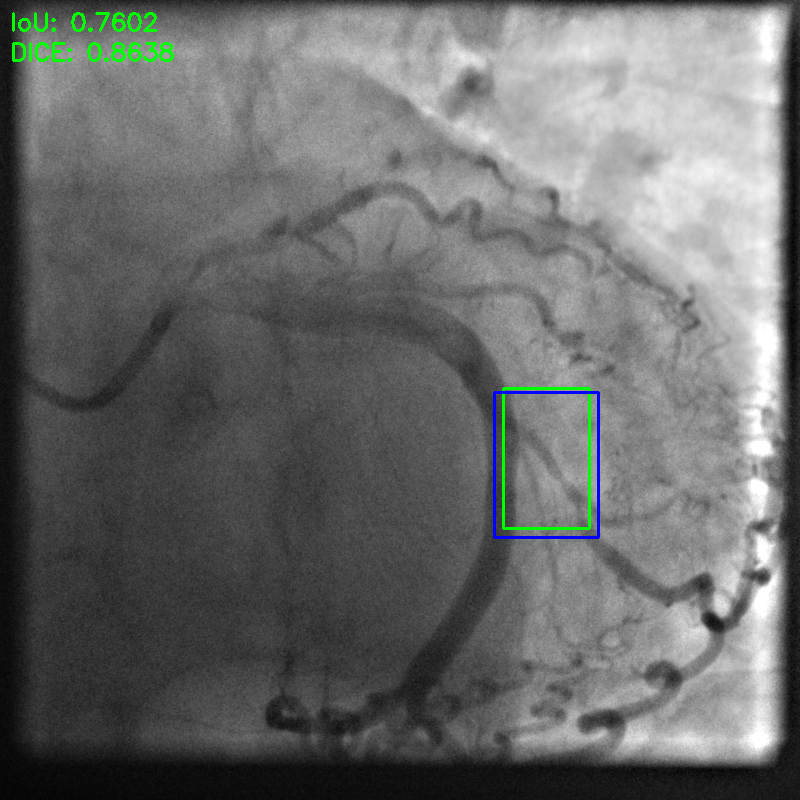


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192



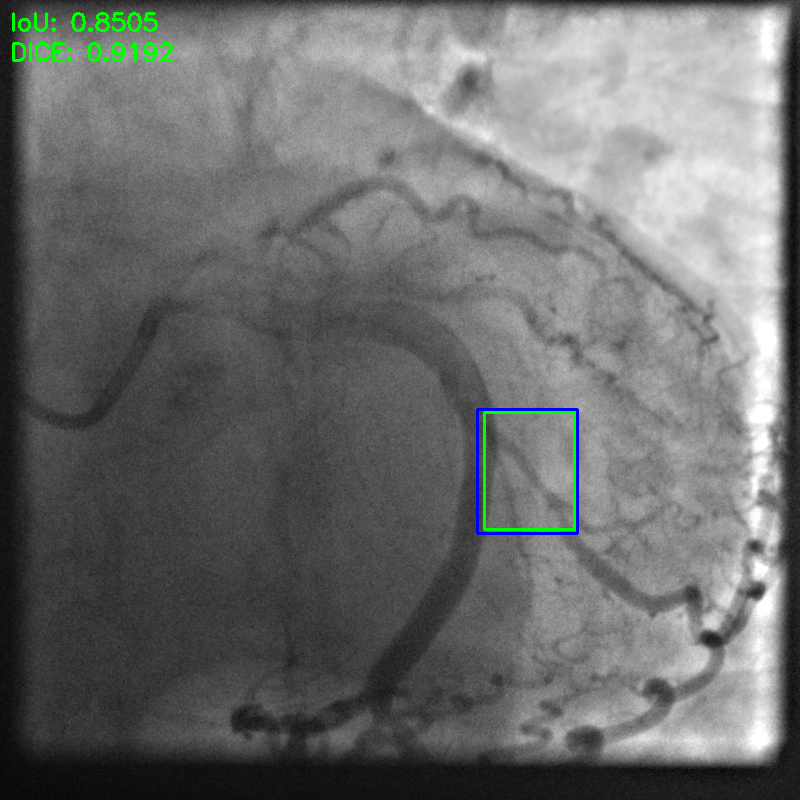


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851



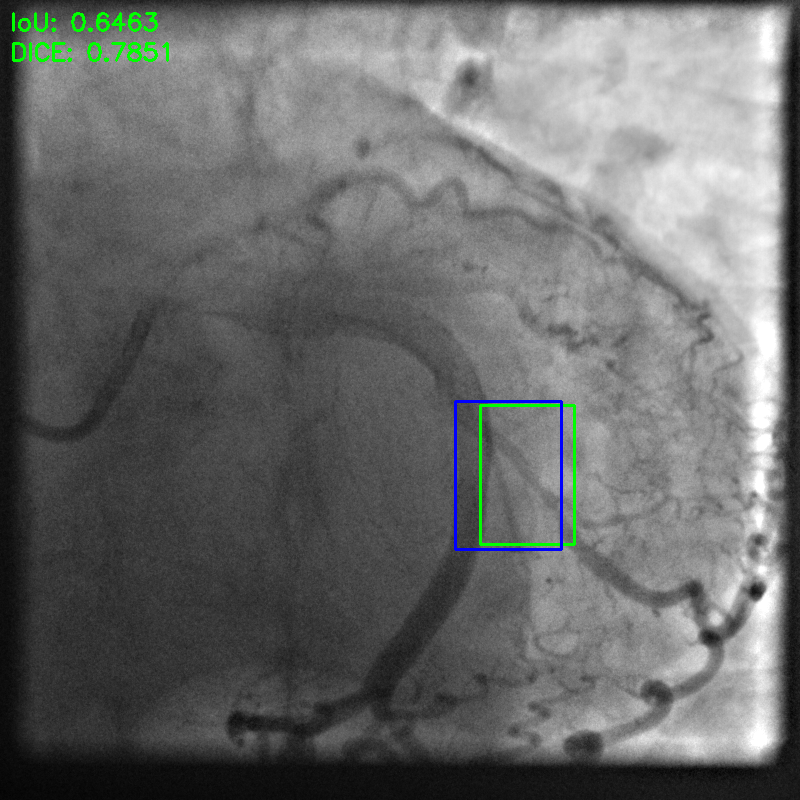


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480



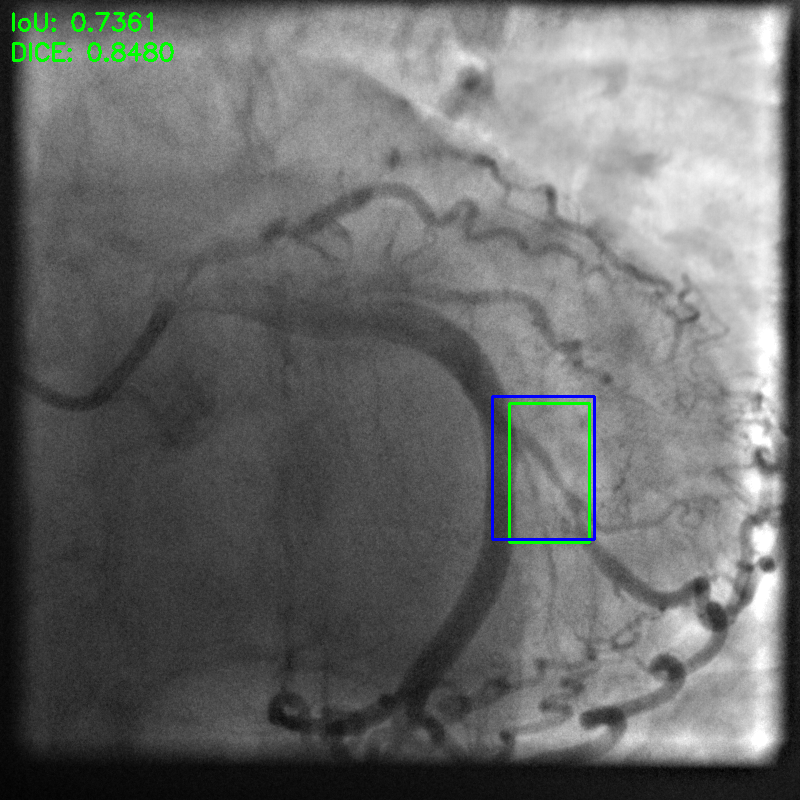


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432



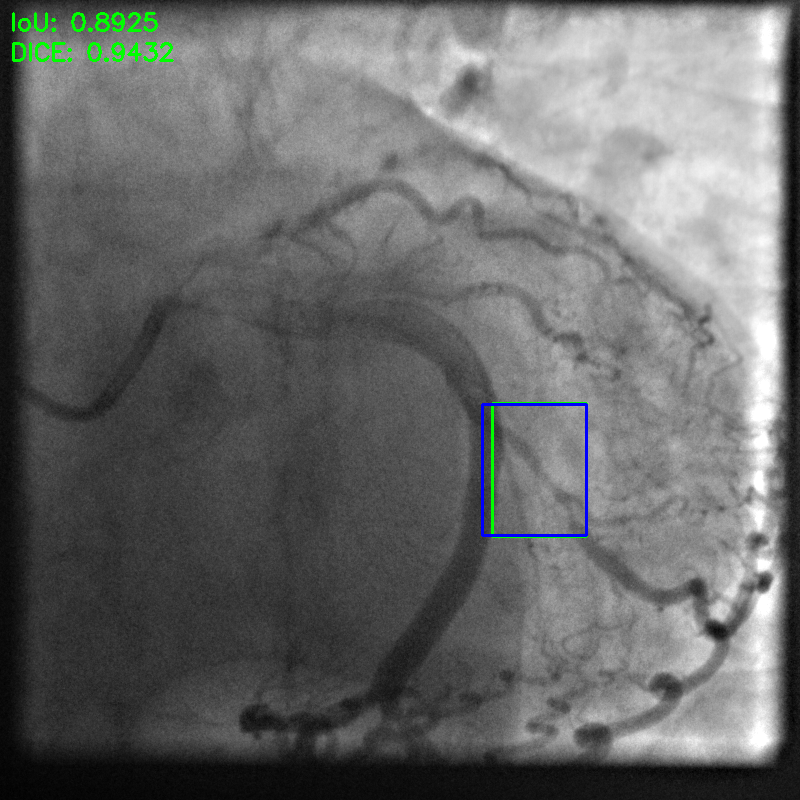


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305



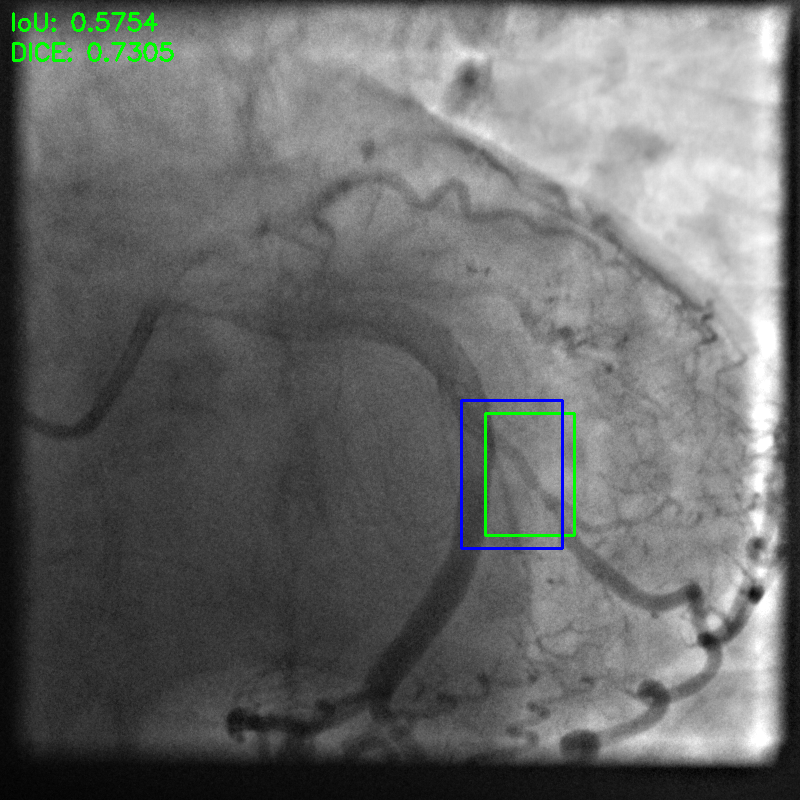


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931



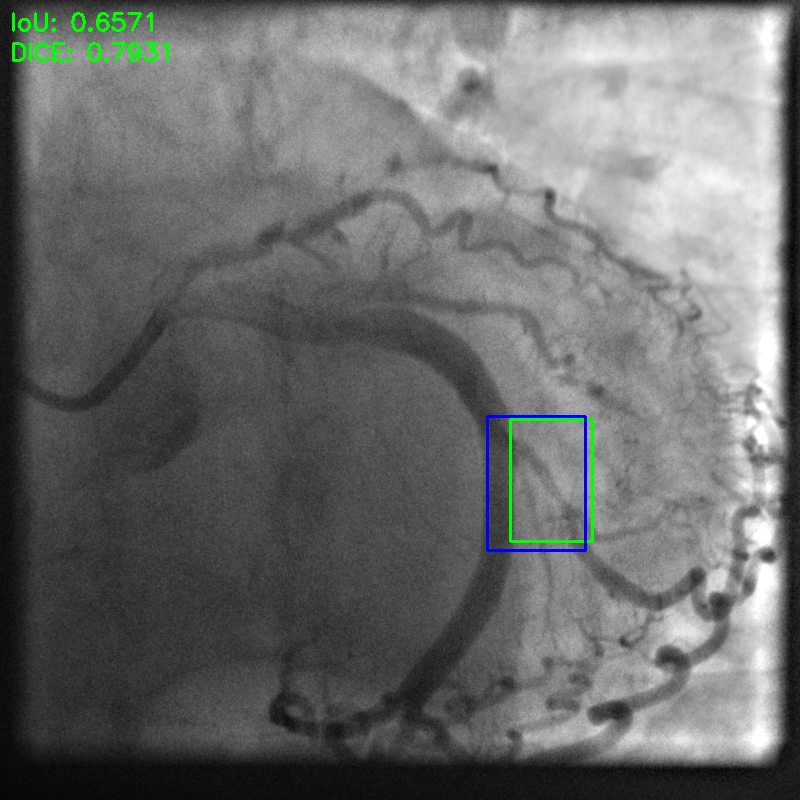


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959



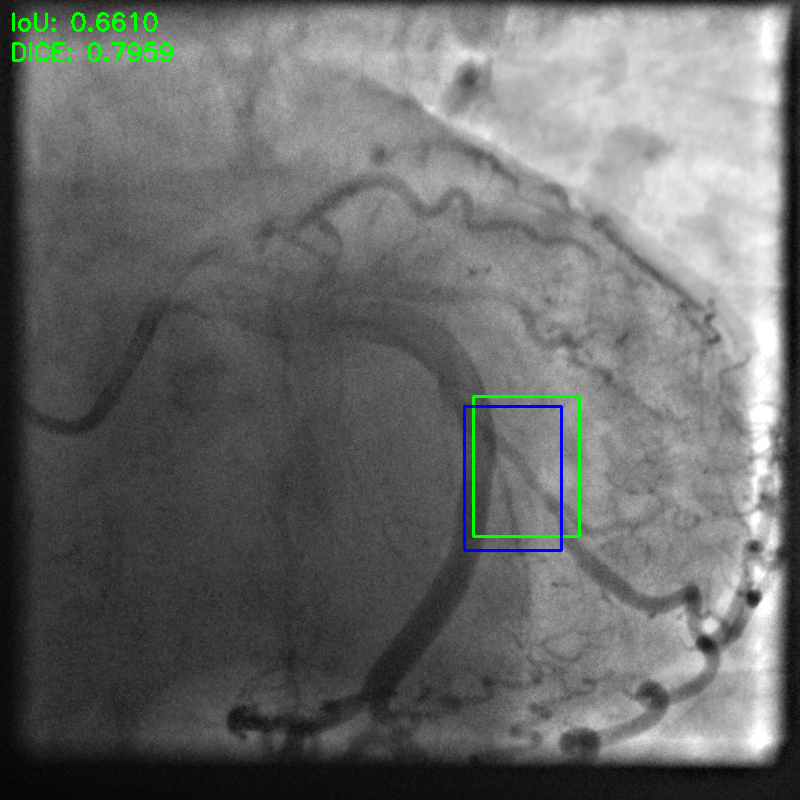


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027



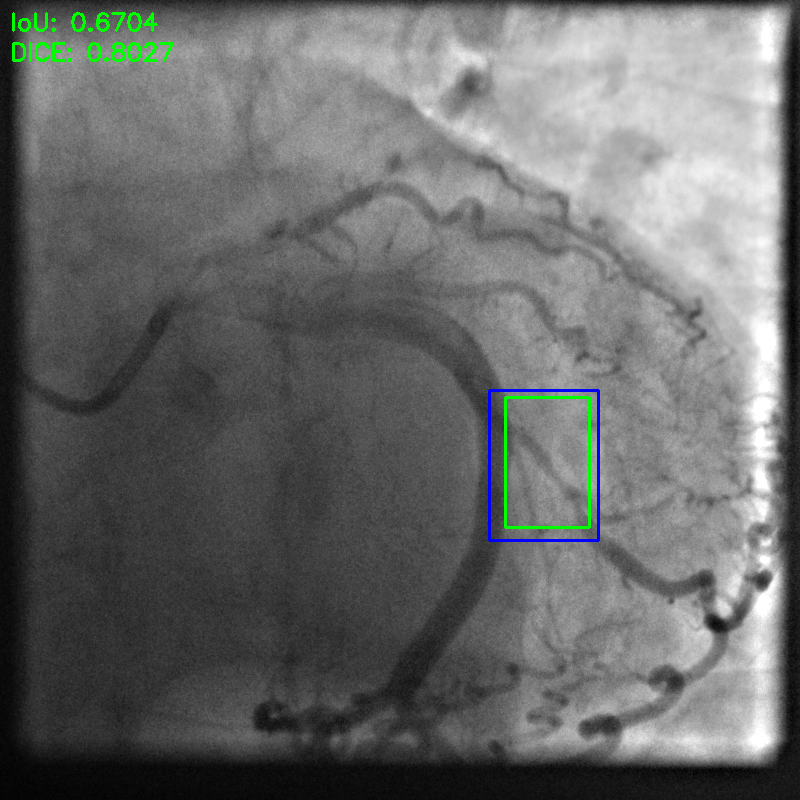


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430



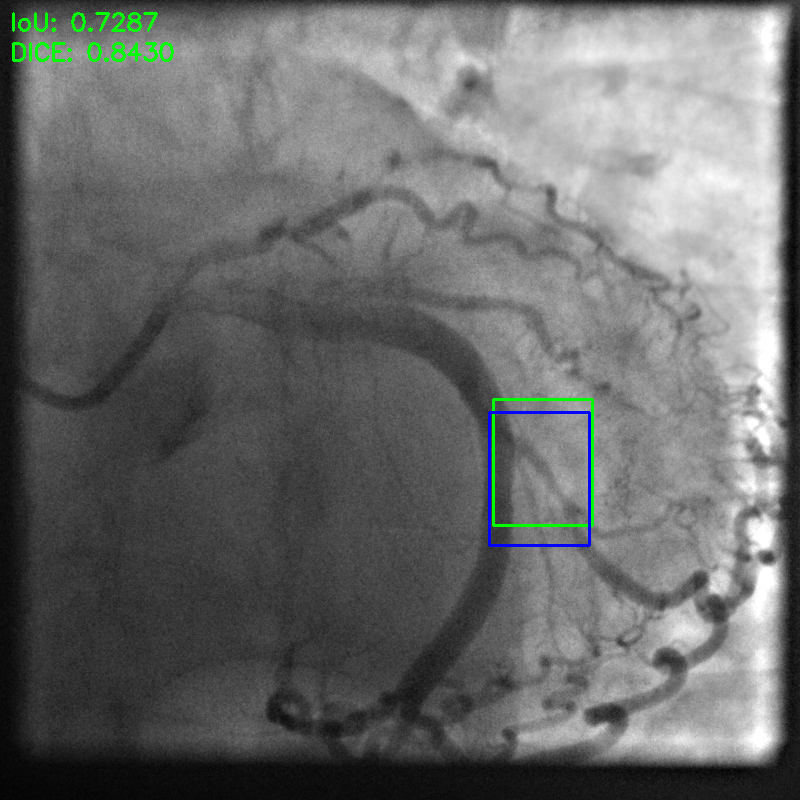

Total tested images: 
10
Average IoU across all images: 0.7178
Average DICE across all images: 0.8325


In [ ]:
from google.colab.patches import cv2_imshow

# Initialize variables to store IoU values and count of images
total_iou = 0.0
total_dice = 0.0
num_images = 0

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)
    cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    total_iou += iou  # Accumulate IoU values
    num_images += 1  # Increment the count of images
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    total_dice += dice  # Accumulate DICE values
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    # show the output image
    cv2_imshow(image)

print("Total tested images: ")
print(num_images)
# Calculate the average IoU
average_iou = total_iou / num_images if num_images > 0 else 0.0

# Print the average IoU value
print("Average IoU across all images: {:.4f}".format(average_iou))

# Calculate the average DICE
average_dice = total_dice / num_images if num_images > 0 else 0.0

# Print the average DICE value
print("Average DICE across all images: {:.4f}".format(average_dice))


# Cropped prediction bounding boxes


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638



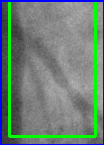


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192



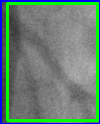


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851



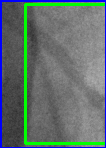


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480



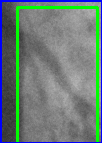


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432



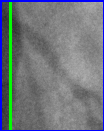


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305



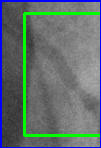


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931



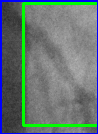


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959



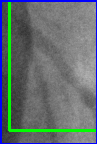


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027



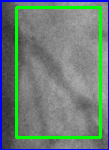


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430



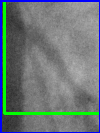

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)
    cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    # show the output image
    #cv2_imshow(image)
    x1, y1, x2, y2 = detection.prediction
    cropped_image = image[y1:y2, x1:x2]
    cv2_imshow(cropped_image)



In [ ]:
!pip install opencv-python


#Frangi vesselness

In [ ]:
!pip install scikit-image



Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638



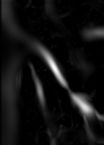


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192



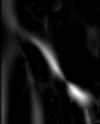


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851



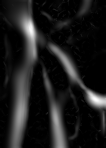


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480



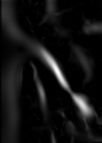


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432



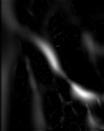


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305



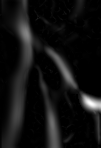


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931



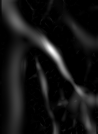


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959



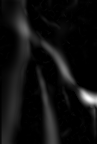


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027



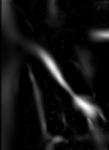


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430



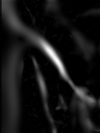

In [ ]:
from google.colab.patches import cv2_imshow


# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    #cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)
    #cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    # show the output image
    #cv2_imshow(image)
    x1, y1, x2, y2 = detection.prediction
    cropped_image = image[y1:y2, x1:x2]
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    from skimage import exposure
    from skimage.filters import frangi
    from google.colab.patches import cv2_imshow
    # Enhance the contrast using histogram equalization
    enhanced_image = exposure.equalize_hist(gray_image)

    # Apply the Frangi filter
    frangi_image = frangi(enhanced_image)

    # Normalize the output to the range [0, 255]
    frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
    cv2_imshow(frangi_image)



In [ ]:
def get_contour_areas(contours):

    all_areas= []

    for cnt in contours:
        area= cv2.contourArea(cnt)
        all_areas.append(area)

    return all_areas


In [ ]:
def convert_tuple_to_int(tuple1):
    new_tuple = []
    for element in tuple1:
        if isinstance(element, float):
            new_tuple.append(int(element))
        else:
            new_tuple.append(element)
    return new_tuple


In [ ]:
def calculate_midpoint(coord1, coord2):
    x_mid = (coord1[0] + coord2[0]) // 2
    y_mid = (coord1[1] + coord2[1]) // 2
    return x_mid, y_mid



In [ ]:
def draw_midpoint_on_image(image, coord1, coord2):

    # Calculate midpoint
    midpoint = calculate_midpoint(coord1, coord2)

    # Draw coordinates
    # cv2.line(image, coord1, coord2, (0, 255, 0), 2)

    # Draw midpoint
    # cv2.drawMarker(image, midpoint, (0, 255, 0), markerType=cv2.MARKER_SQUARE, markerSize=4, thickness=1)
    cv.circle(image, midpoint, 0, (0, 255, 0), 3)



In [ ]:
import math

def calculate_distance(point1, point2):
    x1, y1 = point1
    x2, y2 = point2
    distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
    return distance



In [ ]:
def get_midpoint(coord1, coord2):

    # Calculate midpoint
    midpoint = calculate_midpoint(coord1, coord2)
    return midpoint


# Determining Optimal Stent Dimensions

### 14_006_1_0148.bmp


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
((65.71259307861328, 85.17652893066406), (101.28556823730469, 17.523540496826172), 50.01311492919922)
((38.08054733276367, 84.75442504882812), (39.714500427246094, 6.205390453338623), 77.19573211669922)
((94.5, 32.0), (8.0, 17.0), 90.0)


<ipython-input-51-b3abc5d6bd1a>:127: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-51-b3abc5d6bd1a>:136: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box1 = np.int0(box1)


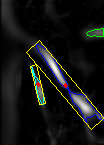

Drawing midpoints:


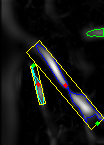


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
((82.59774780273438, 99.9199447631836), (48.01588439941406, 18.836519241333008), 57.80426788330078)
((48.82439422607422, 56.31951141357422), (54.572059631347656, 12.791098594665527), 57.094757080078125)
((37.5, 111.0), (7.0, 24.0), 0.0)


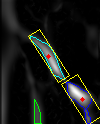

Drawing midpoints:


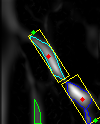


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
((26.41823959350586, 73.86526489257812), (25.381694793701172, 147.89889526367188), 3.2572221755981445)
((76.01487731933594, 76.93460083007812), (84.97225952148438, 17.187908172607422), 46.50743103027344)
((54.645729064941406, 109.04920959472656), (78.30390930175781, 13.701807022094727), 82.09283447265625)


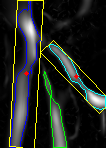

Drawing midpoints:


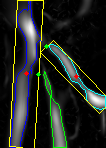


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
((64.95673370361328, 80.24227905273438), (88.155517578125, 14.220235824584961), 55.124671936035156)
((41.29411697387695, 92.17646789550781), (23.768489837646484, 5.335783958435059), 75.96376037597656)
((95.5, 27.0), (4.0, 11.0), 90.0)


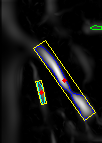

Drawing midpoints:


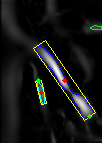


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
((50.39887619018555, 55.93819808959961), (49.501895904541016, 11.765975952148438), 57.9946174621582)
((81.83378601074219, 94.64730072021484), (38.15884780883789, 15.232345581054688), 27.89727020263672)
((90.70000457763672, 118.90001678466797), (18.335756301879883, 6.7082037925720215), 63.43495178222656)


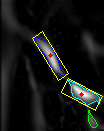

Drawing midpoints:


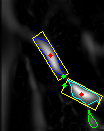

The distance between (63, 76) and (64, 85) in image is 14_006_1_0148.bmp is (stent length): 9.055385138137417
The distance between (32, 38) and (42, 31) in image is 14_006_1_0148.bmp is (stent width): 12.206555615733702


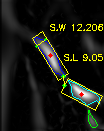


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
((26.035259246826172, 41.114952087402344), (49.26129150390625, 13.251420021057129), 79.28687286376953)
((52.703548431396484, 126.0531005859375), (42.63867950439453, 10.177407264709473), 86.18592071533203)
((62.40447235107422, 67.75442504882812), (48.7228889465332, 9.311079025268555), 58.73626708984375)


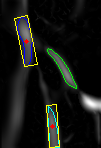

Drawing midpoints:


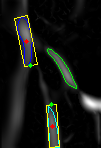


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
((48.21933364868164, 52.20062255859375), (139.38720703125, 17.098527908325195), 46.84760665893555)
((15.550498962402344, 87.51498413085938), (58.96725845336914, 6.3298187255859375), 88.09085083007812)
((88.08394622802734, 124.3941879272461), (21.446334838867188, 6.101633071899414), 64.98310089111328)


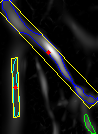

Drawing midpoints:


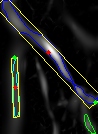


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
((58.84831619262695, 61.65730285644531), (51.197898864746094, 9.221982955932617), 57.9946174621582)
((48.34604263305664, 111.52113342285156), (64.45453643798828, 7.342921257019043), 82.1847152709961)
((89.54632568359375, 98.15677642822266), (29.242210388183594, 15.108475685119629), 46.97493362426758)


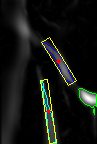

Drawing midpoints:


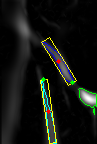


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
((73.64020538330078, 89.25604248046875), (113.46210479736328, 19.779354095458984), 55.34868621826172)
((99.5, 34.0), (10.0, 17.0), 90.0)
((38.33606719970703, 102.30328369140625), (60.86720275878906, 4.638046741485596), 76.75948333740234)


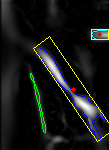

Drawing midpoints:


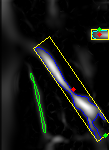


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
((46.074684143066406, 53.291526794433594), (138.2930908203125, 18.265127182006836), 49.45560073852539)
((41.900001525878906, 84.69999694824219), (26.563129425048828, 5.692099571228027), 71.56504821777344)
((12.0, 81.5), (39.0, 2.0), 90.0)


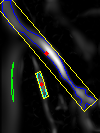

Drawing midpoints:


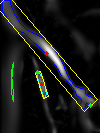

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    x1, y1, x2, y2 = detection.prediction
    cropped_image = image[y1:y2, x1:x2]
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    from skimage import exposure
    from skimage.filters import frangi
    from google.colab.patches import cv2_imshow
    # Enhance the contrast using histogram equalization
    enhanced_image = exposure.equalize_hist(gray_image)

    # Apply the Frangi filter
    frangi_image = frangi(enhanced_image)

    # Normalize the output to the range [0, 255]
    frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
    print("Frangi image")
    #cv2_imshow(frangi_image)

    # Check if the frangi_image is a grayscale image
    if len(frangi_image.shape) == 2:
      # Convert the frangi image to a 3-channel image
      frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

    # Convert the frangi image to grayscale
    gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

    # apply binary thresholding
    ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

    # Create the sharpening kernel
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

    # Sharpen the image
    sharpened_image = cv2.filter2D(thresh, -1, kernel)

    thresh = sharpened_image
    #cv2_imshow(thresh)

    # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
    contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

    # draw contours on the original image
    image_copy = frangi_image.copy()

    """
    `cv2.CHAIN_APPROX_SIMPLE`
    """
    # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
    contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


    sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


    largest_item= sorted_contours[0]
    largest2 = sorted_contours[1]
    largest3 = sorted_contours[2]


    cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
    cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
    cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)
#  (center(x, y), (width, height), angle of rotation)
    rect0 = cv2.minAreaRect(largest_item)
    print(rect0)
    rect1 = cv2.minAreaRect(largest2)
    print(rect1)
    rect2 = cv2.minAreaRect(largest3)
    print(rect2)


    r0 = list(rect0)
    point0 = r0[0]
    point0 = list(point0)
    wh0 = r0[1]
    wh0 = list(wh0)
    # print(point0)

    r1 = list(rect1)
    point1 = r1[0]
    point1 = list(point1)
    wh1 = r1[1]
    wh1 = list(wh1)
    # print(point1)

    x = int(wh0[0]) - int(point0[0])
    y = int(wh0[1]) + int(point0[1])

    cv.circle(image_copy, (int(point0[0]), int(point0[1])), 0, (0, 0, 255), 3)
    cv.circle(image_copy, (int(point1[0]), int(point1[1])), 0, (0, 0, 255), 3)


# https://www.tutorialspoint.com/how-to-find-the-bounding-rectangle-of-an-image-contour-in-opencv-python
    box = cv2.boxPoints(rect0)
    box = np.int0(box)
    img = cv2.drawContours(image_copy,[box],0,(0,255,255),1)

    box1 = cv2.boxPoints(rect1)
    box1 = np.int0(box1)
    img1 = cv2.drawContours(image_copy,[box1],0,(0,255,255),1)
    cv2_imshow(image_copy)

    # finding midpoints of 2 corners of rectangle 1
    coordinate1 =(box[2][0], box[2][1])
    coordinate2 = (box[3][0], box[3][1])


    # Draw the midpoint 1 on the image
    draw_midpoint_on_image(image_copy, coordinate1, coordinate2)

    # finding midpoints of 2 corners of rectangle 2
    coordinate3 =(box1[0][0], box1[0][1])
    coordinate4 = (box1[1][0], box1[1][1])


    # finding midpoints of 2 corners of rectangle 1
    coordinate5 =(box[0][0], box[0][1])
    coordinate6 = (box[1][0], box[1][1])

    # Draw the midpoint 2 on the image
    draw_midpoint_on_image(image_copy, coordinate3, coordinate4)
    print("Drawing midpoints:")

    cv2_imshow(image_copy)


    # checking for just image : 14_006_1_0148.bmp:

    midpoint_a = get_midpoint(coordinate1, coordinate2)
    midpoint_b = get_midpoint(coordinate3, coordinate4)

    cv2.line(image_copy, midpoint_a, midpoint_b, (0,255,255), 1) # stent length
    cv2.line(image_copy, coordinate5, coordinate6, (0,255,255), 1) # stent width

    # Calculate the distance
    distance1 = calculate_distance(coordinate5, coordinate6)
    distance = calculate_distance(midpoint_a, midpoint_b)

    if(detection.filename == '14_006_1_0148.bmp'):
      print(f"The distance between {midpoint_a} and {midpoint_b} in image is 14_006_1_0148.bmp is (stent length): {distance}")
      # Define the text and position
      text = "S.L " +str(distance)
      position = (63, 60)

      # Draw a line across the width of the rectangle
      start_point = (coordinate5[0] +4, (coordinate5[1] + coordinate6[1] + 23) // 2)
      end_point = (coordinate6[0] + 3, (coordinate5[1] + coordinate6[1] + 10) // 2)
      cv2.line(image_copy, start_point, end_point, (0, 255, 255), 1)

      print(f"The distance between {coordinate5} and {coordinate6} in image is 14_006_1_0148.bmp is (stent width): {distance1}")
      #
      cv.circle(image_copy, start_point, 0, (0, 255, 0), 2)
      cv.circle(image_copy, end_point, 0, (0, 255, 0), 2)
      # Define the text and position
      text2 = "S.W "+str(distance1)
      position2 = (49, 30)

      # Choose the font and scale
      font = cv2.FONT_HERSHEY_SIMPLEX
      font_scale = 0.30

      # Choose the color and thickness of the text
      color = (0, 255, 255)  # White color in BGR
      thickness = 1

      # Add text to the image
      cv2.putText(image_copy, text, position, font, font_scale, color, thickness)
      cv2.putText(image_copy, text2, position2, font, font_scale, color, thickness)

      cv2_imshow(image_copy)


for 14_006_1_0149.bmp


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
((65.71259307861328, 85.17652893066406), (101.28556823730469, 17.523540496826172), 50.01311492919922)
((38.08054733276367, 84.75442504882812), (39.714500427246094, 6.205390453338623), 77.19573211669922)
((94.5, 32.0), (8.0, 17.0), 90.0)


<ipython-input-52-b3abc5d6bd1a>:127: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-52-b3abc5d6bd1a>:136: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box1 = np.int0(box1)


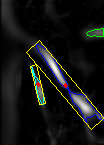

Drawing midpoints:


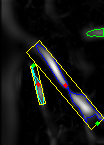


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
((82.59774780273438, 99.9199447631836), (48.01588439941406, 18.836519241333008), 57.80426788330078)
((48.82439422607422, 56.31951141357422), (54.572059631347656, 12.791098594665527), 57.094757080078125)
((37.5, 111.0), (7.0, 24.0), 0.0)


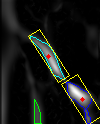

Drawing midpoints:


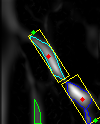


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
((26.41823959350586, 73.86526489257812), (25.381694793701172, 147.89889526367188), 3.2572221755981445)
((76.01487731933594, 76.93460083007812), (84.97225952148438, 17.187908172607422), 46.50743103027344)
((54.645729064941406, 109.04920959472656), (78.30390930175781, 13.701807022094727), 82.09283447265625)


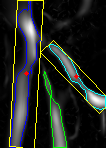

Drawing midpoints:


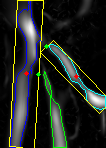


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
((64.95673370361328, 80.24227905273438), (88.155517578125, 14.220235824584961), 55.124671936035156)
((41.29411697387695, 92.17646789550781), (23.768489837646484, 5.335783958435059), 75.96376037597656)
((95.5, 27.0), (4.0, 11.0), 90.0)


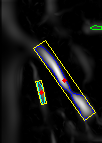

Drawing midpoints:


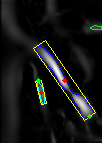


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
((50.39887619018555, 55.93819808959961), (49.501895904541016, 11.765975952148438), 57.9946174621582)
((81.83378601074219, 94.64730072021484), (38.15884780883789, 15.232345581054688), 27.89727020263672)
((90.70000457763672, 118.90001678466797), (18.335756301879883, 6.7082037925720215), 63.43495178222656)


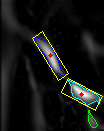

Drawing midpoints:


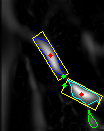

The distance between (63, 76) and (64, 85) in image is 14_006_1_0148.bmp is (stent length): 9.055385138137417
The distance between (32, 38) and (42, 31) in image is 14_006_1_0148.bmp is (stent width): 12.206555615733702


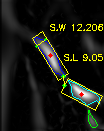


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
((26.035259246826172, 41.114952087402344), (49.26129150390625, 13.251420021057129), 79.28687286376953)
((52.703548431396484, 126.0531005859375), (42.63867950439453, 10.177407264709473), 86.18592071533203)
((62.40447235107422, 67.75442504882812), (48.7228889465332, 9.311079025268555), 58.73626708984375)


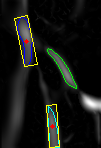

Drawing midpoints:


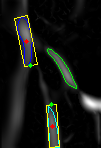


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
((48.21933364868164, 52.20062255859375), (139.38720703125, 17.098527908325195), 46.84760665893555)
((15.550498962402344, 87.51498413085938), (58.96725845336914, 6.3298187255859375), 88.09085083007812)
((88.08394622802734, 124.3941879272461), (21.446334838867188, 6.101633071899414), 64.98310089111328)


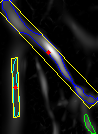

Drawing midpoints:


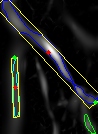


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
((58.84831619262695, 61.65730285644531), (51.197898864746094, 9.221982955932617), 57.9946174621582)
((48.34604263305664, 111.52113342285156), (64.45453643798828, 7.342921257019043), 82.1847152709961)
((89.54632568359375, 98.15677642822266), (29.242210388183594, 15.108475685119629), 46.97493362426758)


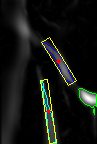

Drawing midpoints:


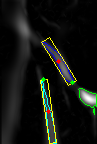


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
((73.64020538330078, 89.25604248046875), (113.46210479736328, 19.779354095458984), 55.34868621826172)
((99.5, 34.0), (10.0, 17.0), 90.0)
((38.33606719970703, 102.30328369140625), (60.86720275878906, 4.638046741485596), 76.75948333740234)


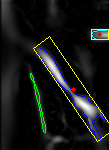

Drawing midpoints:


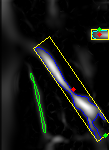


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
((46.074684143066406, 53.291526794433594), (138.2930908203125, 18.265127182006836), 49.45560073852539)
((41.900001525878906, 84.69999694824219), (26.563129425048828, 5.692099571228027), 71.56504821777344)
((12.0, 81.5), (39.0, 2.0), 90.0)


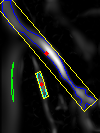

Drawing midpoints:


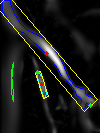

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    # show the output image
    #cv2_imshow(image)
    x1, y1, x2, y2 = detection.prediction
    cropped_image = image[y1:y2, x1:x2]
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    from skimage import exposure
    from skimage.filters import frangi
    from google.colab.patches import cv2_imshow
    # Enhance the contrast using histogram equalization
    enhanced_image = exposure.equalize_hist(gray_image)

    # Apply the Frangi filter
    frangi_image = frangi(enhanced_image)

    # Normalize the output to the range [0, 255]
    frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
    print("Frangi image")
    #cv2_imshow(frangi_image)

    # Check if the frangi_image is a grayscale image
    if len(frangi_image.shape) == 2:
      # Convert the frangi image to a 3-channel image
      frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

    # Convert the frangi image to grayscale
    gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

    # apply binary thresholding
    ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

    # Create the sharpening kernel
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

    # Sharpen the image
    sharpened_image = cv2.filter2D(thresh, -1, kernel)

    thresh = sharpened_image
    #cv2_imshow(thresh)

    # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
    contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

    # draw contours on the original image
    image_copy = frangi_image.copy()
    #cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
    #cv2_imshow(image_copy)

    """
    `cv2.CHAIN_APPROX_SIMPLE`
    """
    # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
    contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


    sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


    largest_item= sorted_contours[0]
    largest2 = sorted_contours[1]
    largest3 = sorted_contours[2]


    cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
    cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
    cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)
#  (center(x, y), (width, height), angle of rotation)
    rect0 = cv2.minAreaRect(largest_item)
    print(rect0)
    rect1 = cv2.minAreaRect(largest2)
    print(rect1)
    rect2 = cv2.minAreaRect(largest3)
    print(rect2)


    r0 = list(rect0)
    point0 = r0[0]
    point0 = list(point0)
    wh0 = r0[1]
    wh0 = list(wh0)
    # print(point0)

    r1 = list(rect1)
    point1 = r1[0]
    point1 = list(point1)
    wh1 = r1[1]
    wh1 = list(wh1)
    # print(point1)

    x = int(wh0[0]) - int(point0[0])
    y = int(wh0[1]) + int(point0[1])

    cv.circle(image_copy, (int(point0[0]), int(point0[1])), 0, (0, 0, 255), 3)
    cv.circle(image_copy, (int(point1[0]), int(point1[1])), 0, (0, 0, 255), 3)


# https://www.tutorialspoint.com/how-to-find-the-bounding-rectangle-of-an-image-contour-in-opencv-python
    box = cv2.boxPoints(rect0)
    box = np.int0(box)
    img = cv2.drawContours(image_copy,[box],0,(0,255,255),1)

    box1 = cv2.boxPoints(rect1)
    box1 = np.int0(box1)
    img1 = cv2.drawContours(image_copy,[box1],0,(0,255,255),1)

    cv2_imshow(image_copy)
    #cv2_imshow(img)


    # finding midpoints of 2 corners of rectangle 1
    coordinate1 =(box[2][0], box[2][1])
    coordinate2 = (box[3][0], box[3][1])


    # Draw the midpoint 1 on the image
    draw_midpoint_on_image(image_copy, coordinate1, coordinate2)

    # finding midpoints of 2 corners of rectangle 2
    coordinate3 =(box1[0][0], box1[0][1])
    coordinate4 = (box1[1][0], box1[1][1])


    # finding midpoints of 2 corners of rectangle 1
    coordinate5 =(box[0][0], box[0][1])
    coordinate6 = (box[1][0], box[1][1])

    # Draw the midpoint 2 on the image
    draw_midpoint_on_image(image_copy, coordinate3, coordinate4)
    print("Drawing midpoints:")

    cv2_imshow(image_copy)


    # checking for just image : 14_006_1_0148.bmp:

    midpoint_a = get_midpoint(coordinate1, coordinate2)
    midpoint_b = get_midpoint(coordinate3, coordinate4)

    cv2.line(image_copy, midpoint_a, midpoint_b, (0,255,255), 1) # stent length
    cv2.line(image_copy, coordinate5, coordinate6, (0,255,255), 1) # stent width

    # Calculate the distance
    distance1 = calculate_distance(coordinate5, coordinate6)
    distance = calculate_distance(midpoint_a, midpoint_b)

    if(detection.filename == '14_006_1_0148.bmp'):
      print(f"The distance between {midpoint_a} and {midpoint_b} in image is 14_006_1_0148.bmp is (stent length): {distance}")
      # Define the text and position
      text = "S.L " +str(distance)
      position = (63, 60)

      # Draw a line across the width of the rectangle
      start_point = (coordinate5[0] +4, (coordinate5[1] + coordinate6[1] + 23) // 2)
      end_point = (coordinate6[0] + 3, (coordinate5[1] + coordinate6[1] + 10) // 2)
      cv2.line(image_copy, start_point, end_point, (0, 255, 255), 1)

      print(f"The distance between {coordinate5} and {coordinate6} in image is 14_006_1_0148.bmp is (stent width): {distance1}")
      #
      cv.circle(image_copy, start_point, 0, (0, 255, 0), 2)
      cv.circle(image_copy, end_point, 0, (0, 255, 0), 2)
      # Define the text and position
      text2 = "S.W "+str(distance1)
      position2 = (49, 30)

      # Choose the font and scale
      font = cv2.FONT_HERSHEY_SIMPLEX
      font_scale = 0.30

      # Choose the color and thickness of the text
      color = (0, 255, 255)  # White color in BGR
      thickness = 1

      # Add text to the image
      cv2.putText(image_copy, text, position, font, font_scale, color, thickness)
      cv2.putText(image_copy, text2, position2, font, font_scale, color, thickness)

      cv2_imshow(image_copy)


### 14_006_1_0151.bmp


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
((65.71259307861328, 85.17652893066406), (101.28556823730469, 17.523540496826172), 50.01311492919922)
((38.08054733276367, 84.75442504882812), (39.714500427246094, 6.205390453338623), 77.19573211669922)
((94.5, 32.0), (8.0, 17.0), 90.0)


<ipython-input-96-a3cc6e1aed90>:126: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-96-a3cc6e1aed90>:135: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box1 = np.int0(box1)


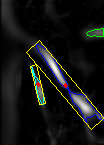

Drawing midpoints:


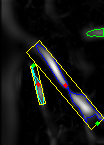


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
((82.59774780273438, 99.9199447631836), (48.01588439941406, 18.836519241333008), 57.80426788330078)
((48.82439422607422, 56.31951141357422), (54.572059631347656, 12.791098594665527), 57.094757080078125)
((37.5, 111.0), (7.0, 24.0), 0.0)


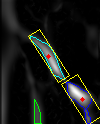

Drawing midpoints:


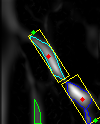


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
((26.41823959350586, 73.86526489257812), (25.381694793701172, 147.89889526367188), 3.2572221755981445)
((76.01487731933594, 76.93460083007812), (84.97225952148438, 17.187908172607422), 46.50743103027344)
((54.645729064941406, 109.04920959472656), (78.30390930175781, 13.701807022094727), 82.09283447265625)


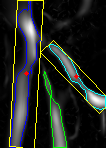

Drawing midpoints:


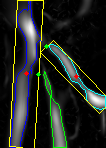


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
((64.95673370361328, 80.24227905273438), (88.155517578125, 14.220235824584961), 55.124671936035156)
((41.29411697387695, 92.17646789550781), (23.768489837646484, 5.335783958435059), 75.96376037597656)
((95.5, 27.0), (4.0, 11.0), 90.0)


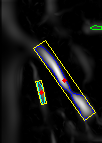

Drawing midpoints:


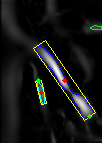


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
((50.39887619018555, 55.93819808959961), (49.501895904541016, 11.765975952148438), 57.9946174621582)
((81.83378601074219, 94.64730072021484), (38.15884780883789, 15.232345581054688), 27.89727020263672)
((90.70000457763672, 118.90001678466797), (18.335756301879883, 6.7082037925720215), 63.43495178222656)


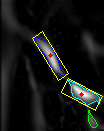

Drawing midpoints:


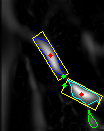


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
((26.035259246826172, 41.114952087402344), (49.26129150390625, 13.251420021057129), 79.28687286376953)
((52.703548431396484, 126.0531005859375), (42.63867950439453, 10.177407264709473), 86.18592071533203)
((62.40447235107422, 67.75442504882812), (48.7228889465332, 9.311079025268555), 58.73626708984375)


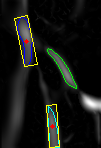

Drawing midpoints:


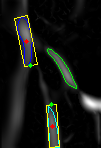

The distance between (30, 65) and (51, 104) in image is 14_006_1_0151.bmp is: 44.294469180700204 (stent length)
The distance between (14, 18) and (27, 15) in image is 14_006_1_0151.bmp is (stent width): 13.341664064126334


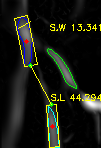


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
((48.21933364868164, 52.20062255859375), (139.38720703125, 17.098527908325195), 46.84760665893555)
((15.550498962402344, 87.51498413085938), (58.96725845336914, 6.3298187255859375), 88.09085083007812)
((88.08394622802734, 124.3941879272461), (21.446334838867188, 6.101633071899414), 64.98310089111328)


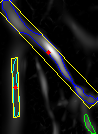

Drawing midpoints:


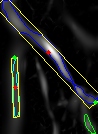


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
((58.84831619262695, 61.65730285644531), (51.197898864746094, 9.221982955932617), 57.9946174621582)
((48.34604263305664, 111.52113342285156), (64.45453643798828, 7.342921257019043), 82.1847152709961)
((89.54632568359375, 98.15677642822266), (29.242210388183594, 15.108475685119629), 46.97493362426758)


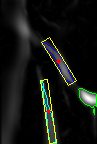

Drawing midpoints:


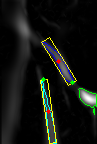


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
((73.64020538330078, 89.25604248046875), (113.46210479736328, 19.779354095458984), 55.34868621826172)
((99.5, 34.0), (10.0, 17.0), 90.0)
((38.33606719970703, 102.30328369140625), (60.86720275878906, 4.638046741485596), 76.75948333740234)


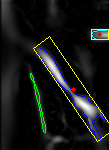

Drawing midpoints:


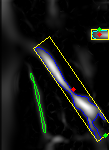


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
((46.074684143066406, 53.291526794433594), (138.2930908203125, 18.265127182006836), 49.45560073852539)
((41.900001525878906, 84.69999694824219), (26.563129425048828, 5.692099571228027), 71.56504821777344)
((12.0, 81.5), (39.0, 2.0), 90.0)


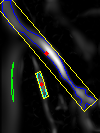

Drawing midpoints:


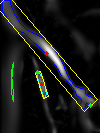

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    # show the output image
    #cv2_imshow(image)
    x1, y1, x2, y2 = detection.prediction
    cropped_image = image[y1:y2, x1:x2]
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    from skimage import exposure
    from skimage.filters import frangi
    from google.colab.patches import cv2_imshow
    # Enhance the contrast using histogram equalization
    enhanced_image = exposure.equalize_hist(gray_image)

    # Apply the Frangi filter
    frangi_image = frangi(enhanced_image)

    # Normalize the output to the range [0, 255]
    frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
    print("Frangi image")
    #cv2_imshow(frangi_image)

    # Check if the frangi_image is a grayscale image
    if len(frangi_image.shape) == 2:
      # Convert the frangi image to a 3-channel image
      frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

    # Convert the frangi image to grayscale
    gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

    # apply binary thresholding
    ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

    # Create the sharpening kernel
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

    # Sharpen the image
    sharpened_image = cv2.filter2D(thresh, -1, kernel)

    thresh = sharpened_image
    #cv2_imshow(thresh)

    # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
    contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

    # draw contours on the original image
    image_copy = frangi_image.copy()

    """
    `cv2.CHAIN_APPROX_SIMPLE`
    """
    # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
    contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


    sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


    largest_item= sorted_contours[0]
    largest2 = sorted_contours[1]
    largest3 = sorted_contours[2]


    cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
    cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
    cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)
#  (center(x, y), (width, height), angle of rotation)
    rect0 = cv2.minAreaRect(largest_item)
    print(rect0)
    rect1 = cv2.minAreaRect(largest2)
    print(rect1)
    rect2 = cv2.minAreaRect(largest3)
    print(rect2)


    r0 = list(rect0)
    point0 = r0[0]
    point0 = list(point0)
    wh0 = r0[1]
    wh0 = list(wh0)
    # print(point0)

    r1 = list(rect1)
    point1 = r1[0]
    point1 = list(point1)
    wh1 = r1[1]
    wh1 = list(wh1)
    # print(point1)

    x = int(wh0[0]) - int(point0[0])
    y = int(wh0[1]) + int(point0[1])

    cv.circle(image_copy, (int(point0[0]), int(point0[1])), 0, (0, 0, 255), 3)
    cv.circle(image_copy, (int(point1[0]), int(point1[1])), 0, (0, 0, 255), 3)

# https://www.tutorialspoint.com/how-to-find-the-bounding-rectangle-of-an-image-contour-in-opencv-python
    box = cv2.boxPoints(rect0)
    box = np.int0(box)
    img = cv2.drawContours(image_copy,[box],0,(0,255,255),1)

    box1 = cv2.boxPoints(rect1)
    box1 = np.int0(box1)
    img1 = cv2.drawContours(image_copy,[box1],0,(0,255,255),1)

    cv2_imshow(image_copy)
    #cv2_imshow(img)


    # finding midpoints of 2 corners of rectangle 1
    coordinate1 =(box[2][0], box[2][1])
    coordinate2 = (box[3][0], box[3][1])


    # Draw the midpoint 1 on the image
    draw_midpoint_on_image(image_copy, coordinate1, coordinate2)

    # finding midpoints of 2 corners of rectangle 1
    coordinate5 =(box[0][0], box[0][1])
    coordinate6 = (box[1][0], box[1][1])

    # finding midpoints of 2 corners of rectangle 2
    coordinate3 =(box1[0][0], box1[0][1])
    coordinate4 = (box1[1][0], box1[1][1])


    # Draw the midpoint 2 on the image
    draw_midpoint_on_image(image_copy, coordinate3, coordinate4)
    print("Drawing midpoints:")


    cv2_imshow(image_copy)


    # checking for just image : 14_006_1_0151.bmp:

    midpoint_a = get_midpoint(coordinate1, coordinate2)
    midpoint_b = get_midpoint(coordinate3, coordinate4)

    cv2.line(image_copy, midpoint_a, midpoint_b, (0,255,255), 1) # stent length
    cv2.line(image_copy, coordinate5, coordinate6, (0,255,255), 1) # stent width



    # Calculate the distance
    distance1 = calculate_distance(coordinate5, coordinate6)
    distance = calculate_distance(midpoint_a, midpoint_b)
    if(detection.filename == '14_006_1_0151.bmp'):
      print(f"The distance between {midpoint_a} and {midpoint_b} in image is 14_006_1_0151.bmp is: {distance} (stent length)")
      # Define the text and position
      text = "S.L " + str(distance)
      position = (50, 100)  # (x, y) coordinates of the top-left corner of the text

      # Choose the font and scale
      font = cv2.FONT_HERSHEY_SIMPLEX
      font_scale = 0.45

      # Choose the color and thickness of the text
      color = (0, 255, 255)  # White color in BGR
      thickness = 1
      print(f"The distance between {coordinate5} and {coordinate6} in image is 14_006_1_0151.bmp is (stent width): {distance1}")

      # Define the text and position
      text2 = "S.W "+str(distance1)
      position2 = (49, 30)

      # Choose the font and scale
      font = cv2.FONT_HERSHEY_SIMPLEX
      font_scale = 0.30

      # Choose the color and thickness of the text
      color = (0, 255, 255)  # White color in BGR
      thickness = 1

      # Draw a line across the width of the rectangle
      start_point = (coordinate5[0] +4, (coordinate5[1] + coordinate6[1] + 23) // 2)
      end_point = (coordinate6[0] + 3, (coordinate5[1] + coordinate6[1] + 10) // 2)
      cv2.line(image_copy, start_point, end_point, (0, 255, 255), 1)

      # Add text to the image
      cv2.putText(image_copy, text, position, font, font_scale, color, thickness)
      cv2.putText(image_copy, text2, position2, font, font_scale, color, thickness)

      cv2_imshow(image_copy)


### 14_006_1_0150.bmp


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
((65.71259307861328, 85.17652893066406), (101.28556823730469, 17.523540496826172), 50.01311492919922)
((38.08054733276367, 84.75442504882812), (39.714500427246094, 6.205390453338623), 77.19573211669922)
((94.5, 32.0), (8.0, 17.0), 90.0)


<ipython-input-98-41829a995cda>:134: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-98-41829a995cda>:152: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box2 = np.int0(box2)


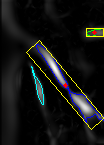

Drawing midpoints:


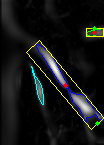


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
((82.59774780273438, 99.9199447631836), (48.01588439941406, 18.836519241333008), 57.80426788330078)
((48.82439422607422, 56.31951141357422), (54.572059631347656, 12.791098594665527), 57.094757080078125)
((37.5, 111.0), (7.0, 24.0), 0.0)


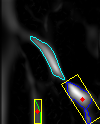

Drawing midpoints:


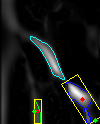


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
((26.41823959350586, 73.86526489257812), (25.381694793701172, 147.89889526367188), 3.2572221755981445)
((76.01487731933594, 76.93460083007812), (84.97225952148438, 17.187908172607422), 46.50743103027344)
((54.645729064941406, 109.04920959472656), (78.30390930175781, 13.701807022094727), 82.09283447265625)


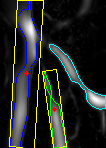

Drawing midpoints:


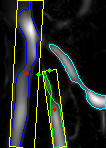


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
((64.95673370361328, 80.24227905273438), (88.155517578125, 14.220235824584961), 55.124671936035156)
((41.29411697387695, 92.17646789550781), (23.768489837646484, 5.335783958435059), 75.96376037597656)
((95.5, 27.0), (4.0, 11.0), 90.0)


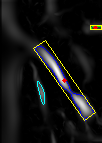

Drawing midpoints:


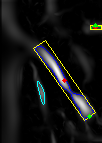


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
((50.39887619018555, 55.93819808959961), (49.501895904541016, 11.765975952148438), 57.9946174621582)
((81.83378601074219, 94.64730072021484), (38.15884780883789, 15.232345581054688), 27.89727020263672)
((90.70000457763672, 118.90001678466797), (18.335756301879883, 6.7082037925720215), 63.43495178222656)


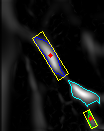

Drawing midpoints:


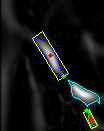


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
((26.035259246826172, 41.114952087402344), (49.26129150390625, 13.251420021057129), 79.28687286376953)
((52.703548431396484, 126.0531005859375), (42.63867950439453, 10.177407264709473), 86.18592071533203)
((62.40447235107422, 67.75442504882812), (48.7228889465332, 9.311079025268555), 58.73626708984375)


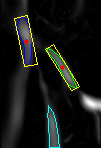

Drawing midpoints:


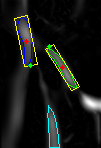


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
((48.21933364868164, 52.20062255859375), (139.38720703125, 17.098527908325195), 46.84760665893555)
((15.550498962402344, 87.51498413085938), (58.96725845336914, 6.3298187255859375), 88.09085083007812)
((88.08394622802734, 124.3941879272461), (21.446334838867188, 6.101633071899414), 64.98310089111328)


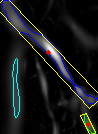

Drawing midpoints:


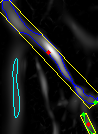


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
((58.84831619262695, 61.65730285644531), (51.197898864746094, 9.221982955932617), 57.9946174621582)
((48.34604263305664, 111.52113342285156), (64.45453643798828, 7.342921257019043), 82.1847152709961)
((89.54632568359375, 98.15677642822266), (29.242210388183594, 15.108475685119629), 46.97493362426758)


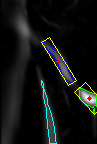

Drawing midpoints:


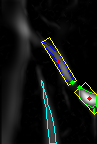

The distance between (72, 82) and (79, 87) in image is 14_006_1_0150.bmp is (stent length): 8.602325267042627
The distance between (41, 42) and (49, 37) in image is 14_006_1_0150.bmp is (stent width): 17.029386365926403


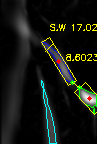


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
((73.64020538330078, 89.25604248046875), (113.46210479736328, 19.779354095458984), 55.34868621826172)
((99.5, 34.0), (10.0, 17.0), 90.0)
((38.33606719970703, 102.30328369140625), (60.86720275878906, 4.638046741485596), 76.75948333740234)


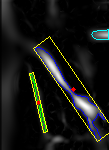

Drawing midpoints:


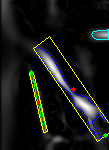


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
((46.074684143066406, 53.291526794433594), (138.2930908203125, 18.265127182006836), 49.45560073852539)
((41.900001525878906, 84.69999694824219), (26.563129425048828, 5.692099571228027), 71.56504821777344)
((12.0, 81.5), (39.0, 2.0), 90.0)


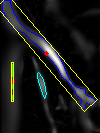

Drawing midpoints:


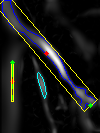

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    # show the output image
    #cv2_imshow(image)
    x1, y1, x2, y2 = detection.prediction
    cropped_image = image[y1:y2, x1:x2]
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    from skimage import exposure
    from skimage.filters import frangi
    from google.colab.patches import cv2_imshow
    # Enhance the contrast using histogram equalization
    enhanced_image = exposure.equalize_hist(gray_image)

    # Apply the Frangi filter
    frangi_image = frangi(enhanced_image)

    # Normalize the output to the range [0, 255]
    frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
    print("Frangi image")
    #cv2_imshow(frangi_image)

    # Check if the frangi_image is a grayscale image
    if len(frangi_image.shape) == 2:
      # Convert the frangi image to a 3-channel image
      frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

    # Convert the frangi image to grayscale
    gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

    # apply binary thresholding
    ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

    # Create the sharpening kernel
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

    # Sharpen the image
    sharpened_image = cv2.filter2D(thresh, -1, kernel)

    thresh = sharpened_image
    #cv2_imshow(thresh)

    # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
    contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

    # draw contours on the original image
    image_copy = frangi_image.copy()

    """
    `cv2.CHAIN_APPROX_SIMPLE`
    """
    # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
    contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


    sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


    largest_item= sorted_contours[0]
    largest2 = sorted_contours[1]
    largest3 = sorted_contours[2]


    cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
    cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
    cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)
#  (center(x, y), (width, height), angle of rotation)
    rect0 = cv2.minAreaRect(largest_item)
    print(rect0)
    rect1 = cv2.minAreaRect(largest2)
    print(rect1)
    rect2 = cv2.minAreaRect(largest3)
    print(rect2)


    r0 = list(rect0)
    point0 = r0[0]
    point0 = list(point0)
    wh0 = r0[1]
    wh0 = list(wh0)
    # print(point0)

    r1 = list(rect1)
    point1 = r1[0]
    point1 = list(point1)
    wh1 = r1[1]
    wh1 = list(wh1)
    # print(point1)

    r2 = list(rect2)
    point2 = r2[0]
    point2 = list(point2)
    wh2 = r2[1]
    wh2 = list(wh2)
    # print(point2)

    x = int(wh0[0]) - int(point0[0])
    y = int(wh0[1]) + int(point0[1])

    cv.circle(image_copy, (int(point0[0]), int(point0[1])), 0, (0, 0, 255), 3)
    cv.circle(image_copy, (int(point2[0]), int(point2[1])), 0, (0, 0, 255), 3)


# https://www.tutorialspoint.com/how-to-find-the-bounding-rectangle-of-an-image-contour-in-opencv-python
    box = cv2.boxPoints(rect0)
    box = np.int0(box)
    img = cv2.drawContours(image_copy,[box],0,(0,255,255),1)

    box2 = cv2.boxPoints(rect2)
    box2 = np.int0(box2)
    img2 = cv2.drawContours(image_copy,[box2],0,(0,255,255),1)

    cv2_imshow(image_copy)
    #cv2_imshow(img)


    # finding midpoints of 2 corners of rectangle 1
    coordinate1 =(box[2][0], box[2][1])
    coordinate2 = (box[3][0], box[3][1])


    # Draw the midpoint 1 on the image
    draw_midpoint_on_image(image_copy, coordinate1, coordinate2)

    # finding midpoints of 2 corners of rectangle 2
    coordinate3 =(box2[0][0], box2[0][1])
    coordinate4 = (box2[1][0], box2[1][1])


    # Draw the midpoint 2 on the image
    draw_midpoint_on_image(image_copy, coordinate3, coordinate4)
    print("Drawing midpoints:")


    cv2_imshow(image_copy)

    # finding midpoints of 2 corners of rectangle 1
    coordinate5 =(box[0][0], box[0][1])
    coordinate6 = (box[1][0], box[1][1])

    # checking for just image : 14_006_1_0150.bmp:

    midpoint_a = get_midpoint(coordinate1, coordinate2)
    midpoint_b = get_midpoint(coordinate3, coordinate4)

    cv2.line(image_copy, midpoint_a, midpoint_b, (0,255,255), 1)
    cv2.line(image_copy, coordinate5, coordinate6, (0,255,255), 1)


    # Calculate the distance
    distance = calculate_distance(midpoint_a, midpoint_b)
    if(detection.filename == '14_006_1_0150.bmp'):
      print(f"The distance between {midpoint_a} and {midpoint_b} in image is 14_006_1_0150.bmp is (stent length): {distance}")
      # Define the text and position
      text = str(distance)
      position = (65, 60)  # (x, y) coordinates of the top-left corner of the text

      # Choose the font and scale
      font = cv2.FONT_HERSHEY_SIMPLEX
      font_scale = 0.45

      # Choose the color and thickness of the text
      color = (0, 255, 255)  # White color in BGR
      thickness = 1

      # Add text to the image
      #cv2.putText(image_copy, text, position, font, font_scale, color, thickness)
      print(f"The distance between {coordinate5} and {coordinate6} in image is 14_006_1_0150.bmp is (stent width): {distance1}")

      # Define the text and position
      text2 = "S.W "+str(distance1)
      position2 = (49, 30)

      # Choose the font and scale
      font = cv2.FONT_HERSHEY_SIMPLEX
      font_scale = 0.30

      # Choose the color and thickness of the text
      color = (0, 255, 255)  # White color in BGR
      thickness = 1

      # Draw a line across the width of the rectangle
      start_point = (coordinate5[0] +4, (coordinate5[1] + coordinate6[1] + 23) // 2)
      end_point = (coordinate6[0] + 3, (coordinate5[1] + coordinate6[1] + 10) // 2)
      cv2.line(image_copy, start_point, end_point, (0, 255, 255), 1)

      # Add text to the image
      cv2.putText(image_copy, text, position, font, font_scale, color, thickness)
      cv2.putText(image_copy, text2, position2, font, font_scale, color, thickness)

      cv2_imshow(image_copy)


#  Centerline Extraction




In [ ]:
def draw_midpoint_on_centerlineimage(image, coord1, coord2):

    # Calculate midpoint
    midpoint = calculate_midpoint(coord1, coord2)
    cv.circle(image, midpoint, 0, (0, 255, 0), 2)

In [ ]:
# Extract the coordinates of the highest point on the largest contour
def get_highest_point(contour):
    max_point = tuple(contour[contour[:, :, 1].argmin()][0])
    return max_point


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Thresh


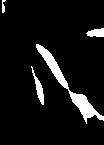

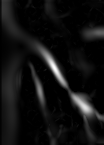

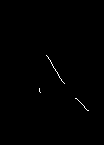

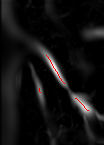

Centerline with contours


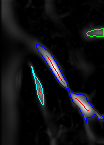

((65.71259307861328, 85.17652893066406), (101.28556823730469, 17.523540496826172), 50.01311492919922)
((38.08054733276367, 84.75442504882812), (39.714500427246094, 6.205390453338623), 77.19573211669922)
((94.5, 32.0), (8.0, 17.0), 90.0)


<ipython-input-57-1cec916fd12d>:152: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-57-1cec916fd12d>:161: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box1 = np.int0(box1)


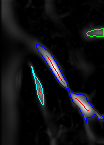

Drawing midpoints:


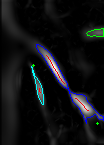


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Thresh


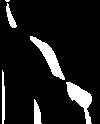

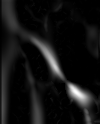

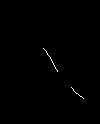

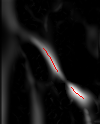

Centerline with contours


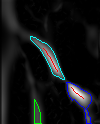

((82.59774780273438, 99.9199447631836), (48.01588439941406, 18.836519241333008), 57.80426788330078)
((48.82439422607422, 56.31951141357422), (54.572059631347656, 12.791098594665527), 57.094757080078125)
((37.5, 111.0), (7.0, 24.0), 0.0)


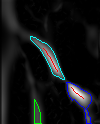

Drawing midpoints:


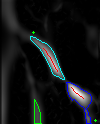


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Thresh


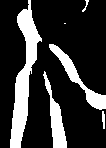

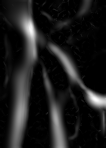

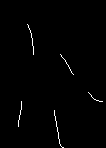

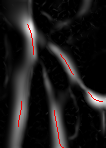

Centerline with contours


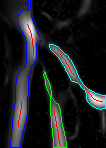

((26.41823959350586, 73.86526489257812), (25.381694793701172, 147.89889526367188), 3.2572221755981445)
((76.01487731933594, 76.93460083007812), (84.97225952148438, 17.187908172607422), 46.50743103027344)
((54.645729064941406, 109.04920959472656), (78.30390930175781, 13.701807022094727), 82.09283447265625)


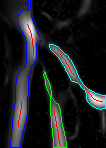

Drawing midpoints:


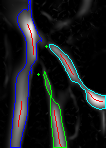


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Thresh


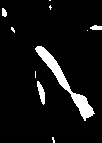

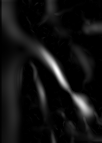

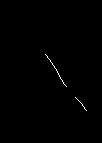

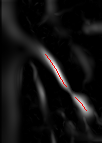

Centerline with contours


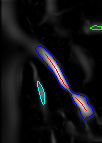

((64.95673370361328, 80.24227905273438), (88.155517578125, 14.220235824584961), 55.124671936035156)
((41.29411697387695, 92.17646789550781), (23.768489837646484, 5.335783958435059), 75.96376037597656)
((95.5, 27.0), (4.0, 11.0), 90.0)


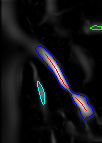

Drawing midpoints:


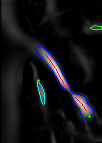


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Thresh


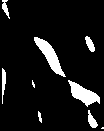

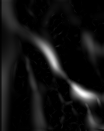

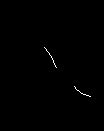

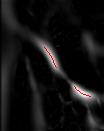

Centerline with contours


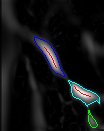

((50.39887619018555, 55.93819808959961), (49.501895904541016, 11.765975952148438), 57.9946174621582)
((81.83378601074219, 94.64730072021484), (38.15884780883789, 15.232345581054688), 27.89727020263672)
((90.70000457763672, 118.90001678466797), (18.335756301879883, 6.7082037925720215), 63.43495178222656)


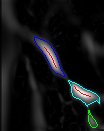

Drawing midpoints:


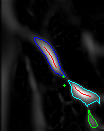

The distance between (63, 76) and (64, 85) in image is 14_006_1_0148.bmp is (stenosis width): 9.055385138137417
The distance between (32, 38) and (42, 31) in image is 14_006_1_0148.bmp is (original cronary artery width): 12.206555615733702


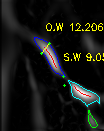


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Thresh


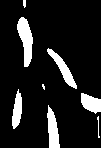

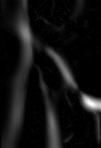

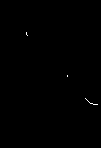

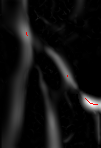

Centerline with contours


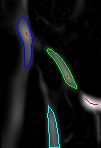

((26.035259246826172, 41.114952087402344), (49.26129150390625, 13.251420021057129), 79.28687286376953)
((52.703548431396484, 126.0531005859375), (42.63867950439453, 10.177407264709473), 86.18592071533203)
((62.40447235107422, 67.75442504882812), (48.7228889465332, 9.311079025268555), 58.73626708984375)


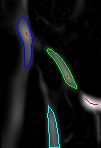

Drawing midpoints:


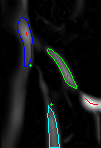


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Thresh


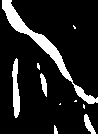

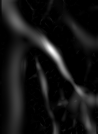

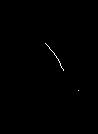

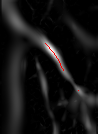

Centerline with contours


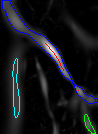

((48.21933364868164, 52.20062255859375), (139.38720703125, 17.098527908325195), 46.84760665893555)
((15.550498962402344, 87.51498413085938), (58.96725845336914, 6.3298187255859375), 88.09085083007812)
((88.08394622802734, 124.3941879272461), (21.446334838867188, 6.101633071899414), 64.98310089111328)


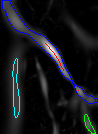

Drawing midpoints:


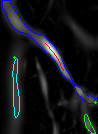


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Thresh


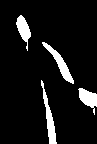

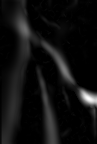

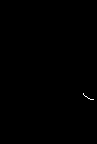

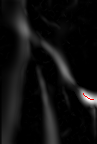

Centerline with contours


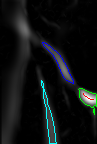

((58.84831619262695, 61.65730285644531), (51.197898864746094, 9.221982955932617), 57.9946174621582)
((48.34604263305664, 111.52113342285156), (64.45453643798828, 7.342921257019043), 82.1847152709961)
((89.54632568359375, 98.15677642822266), (29.242210388183594, 15.108475685119629), 46.97493362426758)


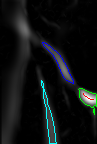

Drawing midpoints:


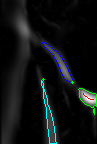


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Thresh


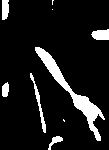

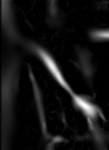

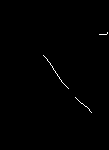

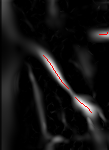

Centerline with contours


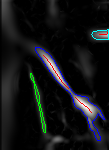

((73.64020538330078, 89.25604248046875), (113.46210479736328, 19.779354095458984), 55.34868621826172)
((99.5, 34.0), (10.0, 17.0), 90.0)
((38.33606719970703, 102.30328369140625), (60.86720275878906, 4.638046741485596), 76.75948333740234)


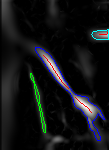

Drawing midpoints:


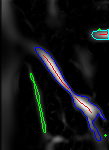


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Thresh


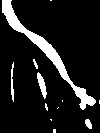

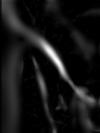

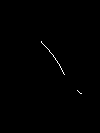

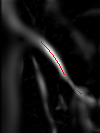

Centerline with contours


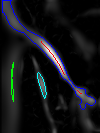

((46.074684143066406, 53.291526794433594), (138.2930908203125, 18.265127182006836), 49.45560073852539)
((41.900001525878906, 84.69999694824219), (26.563129425048828, 5.692099571228027), 71.56504821777344)
((12.0, 81.5), (39.0, 2.0), 90.0)


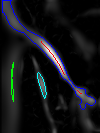

Drawing midpoints:


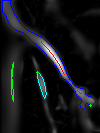

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    #cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)
    #cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()

    # show the output image
    #cv2_imshow(image)
    x1, y1, x2, y2 = detection.prediction
    cropped_image = image[y1:y2, x1:x2]
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    from skimage import exposure
    from skimage.filters import frangi
    from google.colab.patches import cv2_imshow
    # Enhance the contrast using histogram equalization
    enhanced_image = exposure.equalize_hist(gray_image)

    # Apply the Frangi filter
    frangi_image = frangi(enhanced_image)
    # Normalize the output to the range [0, 255]
    frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)



    from skimage import exposure
    from skimage.filters import frangi
    from skimage import exposure, morphology

    # Threshold the Frangi vesselness image
    _, binary_frangi = cv2.threshold(frangi_image, 128, 255, cv2.THRESH_BINARY)
    # Ensure the binary image is properly binary (values of 0 and 1)
    binary_frangi = binary_frangi / 255

    # Apply skeletonization to obtain the central line
    skeleton = morphology.skeletonize(binary_frangi)

    # Overlay the skeleton on the original image
    # Overlay the skeleton on the original image
    overlay_image = np.stack([frangi_image] * 3, axis=-1)
    overlay_image[skeleton, :] = [0, 0, 255]  # Red color for the central line

    # Check if the frangi_image is a grayscale image
    if len(frangi_image.shape) == 2:
      # Convert the frangi image to a 3-channel image
      frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

    # Convert the frangi image to grayscale
    gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

    # apply binary thresholding
    ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

    # Create the sharpening kernel
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

    # Sharpen the image
    sharpened_image = cv2.filter2D(thresh, -1, kernel)

    thresh = sharpened_image
    print("Thresh")
    cv2_imshow(thresh)

    # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
    contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

    # draw contours on the original image
    image_copy = overlay_image.copy()


    """
    Now let's try with `cv2.CHAIN_APPROX_SIMPLE`
    """
    # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
    contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


    sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


    largest_item= sorted_contours[0]
    largest2 = sorted_contours[1]
    largest3 = sorted_contours[2]


    cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
    cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
    cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)

    cv2_imshow(frangi_image)

    cv2_imshow((skeleton * 255).astype(np.uint8))

    cv2_imshow(overlay_image)

    print("Centerline with contours")
    cv2_imshow(image_copy)

    rect0 = cv2.minAreaRect(largest_item)
    print(rect0)
    rect1 = cv2.minAreaRect(largest2)
    print(rect1)
    rect2 = cv2.minAreaRect(largest3)
    print(rect2)


    r0 = list(rect0)
    point0 = r0[0]
    point0 = list(point0)
    wh0 = r0[1]
    wh0 = list(wh0)
    # print(point0)

    r1 = list(rect1)
    point1 = r1[0]
    point1 = list(point1)
    wh1 = r1[1]
    wh1 = list(wh1)
    # print(point1)

    x = int(wh0[0]) - int(point0[0])
    y = int(wh0[1]) + int(point0[1])

    # cv.circle(image_copy, (int(point0[0]), int(point0[1])), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (int(point1[0]), int(point1[1])), 0, (0, 0, 255), 3)


# https://www.tutorialspoint.com/how-to-find-the-bounding-rectangle-of-an-image-contour-in-opencv-python
    box = cv2.boxPoints(rect0)
    box = np.int0(box)
    # img = cv2.drawContours(image_copy,[box],0,(0,255,255),1)
    #print(box)
    # cv.circle(image_copy, (box[0][0], box[0][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box[1][0], box[1][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box[2][0], box[2][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box[3][0], box[3][1]), 0, (0, 0, 255), 3)

    box1 = cv2.boxPoints(rect1)
    box1 = np.int0(box1)
    # img1 = cv2.drawContours(image_copy,[box1],0,(0,255,255),1)
    #print(box1)
    # cv.circle(image_copy, (box1[0][0], box1[0][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box1[1][0], box1[1][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box1[2][0], box1[2][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box1[3][0], box1[3][1]), 0, (0, 0, 255), 3)

    # box2 = cv2.boxPoints(rect2)
    # box2 = np.int0(box2)
    # img2 = cv2.drawContours(image_copy,[box2],0,(0,255,255),1)
    # #print(box2)
    # cv.circle(image_copy, (box2[0][0], box2[0][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box2[1][0], box2[1][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box2[2][0], box2[2][1]), 0, (0, 0, 255), 3)
    # cv.circle(image_copy, (box2[3][0], box2[3][1]), 0, (0, 0, 255), 3)

    cv2_imshow(image_copy)
    #cv2_imshow(img)

# ============= stenosis region =====================
    # finding midpoints of 2 corners of rectangle 1
    coordinate1 =(box[2][0], box[2][1])
    coordinate2 = (box[3][0], box[3][1])


    # Draw the midpoint 1 on the image
    draw_midpoint_on_centerlineimage(image_copy, coordinate1, coordinate2)

    # finding midpoints of 2 corners of rectangle 2
    coordinate3 =(box1[0][0], box1[0][1])
    coordinate4 = (box1[1][0], box1[1][1])


    # finding midpoints of 2 corners of rectangle 1
    coordinate5 =(box[0][0], box[0][1])
    coordinate6 = (box[1][0], box[1][1])

    # Draw the midpoint 2 on the image
    draw_midpoint_on_centerlineimage(image_copy, coordinate3, coordinate4)
    print("Drawing midpoints:")

    cv2_imshow(image_copy)


    # checking for just image : 14_006_1_0148.bmp:

    midpoint_a = get_midpoint(coordinate1, coordinate2)
    midpoint_b = get_midpoint(coordinate3, coordinate4)

    midpoint_a = get_midpoint(coordinate1, coordinate2)
    midpoint_b = get_midpoint(coordinate3, coordinate4)


#    cv2.line(image_copy, midpoint_a, midpoint_b, (0,255,255), 1) # stent length
#    cv2.line(image_copy, coordinate5, coordinate6, (0,255,255), 1) # stent width

    # Calculate the distance
    distance = calculate_distance(midpoint_a, midpoint_b)

    if(detection.filename == '14_006_1_0148.bmp'):

      print(f"The distance between {midpoint_a} and {midpoint_b} in image is 14_006_1_0148.bmp is (stenosis width): {distance}")
      # Define the text and position
      text = "S.W " +str(distance)
      position = (63, 60)




      # Draw a line across the width of the rectangle (original cronary artery width)
      start_point = (coordinate5[0] + 9, (coordinate5[1] + coordinate6[1] + 37) // 2)
      end_point = (coordinate6[0] + 7, (coordinate5[1] + coordinate6[1] + 18) // 2)
      distance1 = calculate_distance(coordinate5, coordinate6)

      cv2.line(image_copy, start_point, end_point, (0, 255, 255), 1)

      print(f"The distance between {coordinate5} and {coordinate6} in image is 14_006_1_0148.bmp is (original cronary artery width): {distance1}")
      cv.circle(image_copy, start_point, 0, (0, 255, 0), 2)
      cv.circle(image_copy, end_point, 0, (0, 255, 0), 2)
      # Define the text and position
      text2 = "O.W "+str(distance1)
      position2 = (45, 30)

      # Choose the font and scale
      font = cv2.FONT_HERSHEY_SIMPLEX
      font_scale = 0.32

      # Choose the color and thickness of the text
      color = (0, 255, 255)  # White color in BGR
      thickness = 1

      # Add text to the image
      cv2.putText(image_copy, text, position, font, font_scale, color, thickness)
      cv2.putText(image_copy, text2, position2, font, font_scale, color, thickness)

      cv2_imshow(image_copy)





Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
(145, 104, 3)
[0, 1, 1, 61, 7, 8, 9, 10, 10, 10, 10, 9, 10, 10, 9, 10, 9, 9, 10, 9, 10, 9, 9, 9, 9, 8, 9, 8, 9, 8, 8, 8, 8, 7, 8, 7, 7, 8, 7, 7, 6, 5, 4, 1, 1, 36, 1, 1, 2, 4, 6, 13, 15, 15, 15, 14, 15, 15, 15, 15, 15, 15, 15, 14, 14, 15, 15, 16, 16, 17, 12, 10, 8, 4, 2, 2, 1, 1, 18, 18, 0]
(145, 104, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(145, 104, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


<ipython-input-59-388984cbe9fb>:140: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-59-388984cbe9fb>:143: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box1 = np.int0(box1)


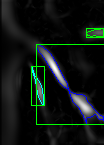

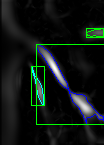


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
(124, 100, 3)
[0, 1, 6, 8, 10, 12, 13, 14, 16, 18, 19, 20, 22, 21, 22, 21, 20, 2, 3, 15, 13, 12, 10, 8, 1, 4, 2, 2, 3, 3, 3, 3, 3, 3, 4, 5, 5, 4, 4, 4, 4, 1]
(124, 100, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(124, 100, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


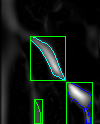

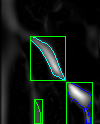


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
(148, 106, 3)
[0, 2, 2, 2, 1, 2, 2, 2, 2, 1, 5, 10, 11, 12, 13, 13, 14, 14, 15, 15, 15, 16, 16, 15, 16, 16, 16, 16, 15, 16, 15, 15, 15, 14, 15, 15, 15, 15, 16, 16, 14, 12, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 8, 8, 7, 7, 6, 7, 6, 8, 9, 9, 9, 10, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 13, 13, 14, 14, 14, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10, 10, 22, 22, 23, 23, 23, 23, 23, 23, 1]
(148, 106, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

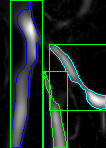

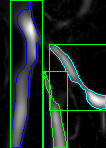


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
(143, 102, 3)
[0, 6, 52, 51, 10, 11, 11, 11, 12, 12, 12, 12, 11, 12, 12, 12, 11, 11, 10, 11, 11, 10, 10, 9, 9, 9, 9, 8, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 6, 5, 1, 3, 3, 3, 3, 5, 9, 12, 13, 14, 13, 13, 13, 13, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 11, 10, 7, 3, 2, 1, 1, 0]
(143, 102, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(143, 102, 3)
[0, 0, 0, 0, 0, 0]


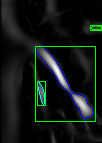

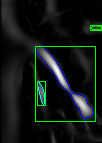


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
(131, 104, 3)
[0, 1, 1, 1, 10, 12, 12, 13, 13, 13, 12, 13, 13, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10, 11, 10, 10, 10, 10, 9, 10, 9, 9, 9, 8, 8, 8, 1, 1, 1, 1, 0]
(131, 104, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(131, 104, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


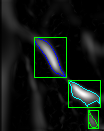

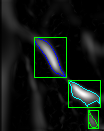


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
(148, 101, 3)
[0, 4, 6, 7, 9, 9, 9, 6, 6, 6, 5, 5, 5, 12, 12, 12, 12, 12, 12, 11, 12, 11, 11, 10, 10, 9, 9, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 5, 5, 4, 4, 1, 0]
(148, 101, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(148, 101, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


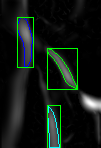

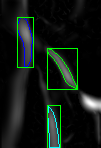


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
(134, 98, 3)
[0, 87, 88, 88, 87, 87, 86, 85, 85, 11, 11, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 13, 14, 14, 13, 14, 14, 14, 14, 14, 1, 1, 1, 1, 1, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 13, 13, 13, 12, 1, 10, 10, 11, 10, 9, 9, 8, 7, 8, 7, 7, 7, 6, 7, 6, 7, 6, 7, 7, 6, 7, 6, 6, 5, 1, 3, 1, 1, 26, 1, 1, 1, 3, 5, 6, 7, 8, 7, 7, 7, 8, 8, 1, 12, 12, 12, 1, 9, 7, 1, 0]
(134, 98, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(134, 98, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


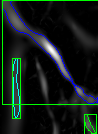

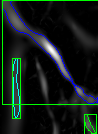


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
(144, 97, 3)
[0, 1, 4, 5, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 8, 7, 7, 7, 7, 8, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 1, 1, 1, 1, 0]
(144, 97, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(144, 97, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


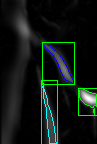

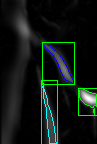


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
(150, 109, 3)
[0, 1, 1, 62, 9, 10, 11, 11, 12, 12, 11, 11, 12, 12, 11, 12, 11, 11, 11, 11, 11, 11, 11, 10, 11, 10, 10, 9, 10, 9, 9, 9, 9, 8, 8, 8, 8, 7, 7, 7, 6, 6, 6, 1, 4, 4, 4, 5, 6, 10, 14, 16, 15, 15, 16, 17, 17, 19, 20, 21, 21, 1, 1, 19, 18, 18, 15, 13, 12, 10, 9, 8, 7, 6, 4, 4, 4, 4, 4, 5, 6, 6, 7, 1, 4, 4, 4, 5, 4, 5, 5, 4, 4, 1, 0]
(150, 109, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(150, 109, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


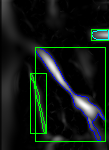

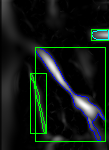


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
(133, 100, 3)
[0, 87, 87, 87, 87, 86, 86, 86, 85, 85, 84, 84, 10, 10, 10, 10, 10, 10, 11, 10, 11, 11, 11, 11, 12, 12, 12, 12, 12, 1, 1, 1, 1, 9, 10, 11, 12, 13, 14, 14, 14, 14, 14, 1, 13, 14, 13, 13, 13, 13, 13, 12, 12, 12, 11, 12, 12, 11, 11, 10, 10, 9, 9, 9, 9, 8, 8, 8, 7, 7, 7, 7, 7, 6, 7, 6, 7, 6, 6, 1, 4, 4, 4, 3, 3, 3, 4, 5, 7, 11, 11, 10, 10, 10, 10, 11, 1, 12, 13, 13, 14, 14, 14, 6, 6, 5, 5, 5, 3, 1, 0]
(133, 100, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
(133, 100, 3)
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


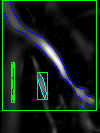

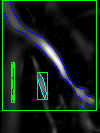

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
    if detection.prediction:
        image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
        #cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
        print()
        print("Ground Truth: (GREEN)")
        print(detection.ground_truth)
        print("Prediction: (BLUE)")
        print(detection.prediction)
        #cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

        # compute the intersection over union and display it
        iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
        cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print()
        print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
        # compute the dice coefficient and display it
        dice = bb_dice(detection.ground_truth, detection.prediction)
        cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

        print()

        # show the output image
        #cv2_imshow(image)
        x1, y1, x2, y2 = detection.prediction
        cropped_image = image[y1:y2, x1:x2]
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

        from skimage import exposure
        from skimage.filters import frangi
        from google.colab.patches import cv2_imshow
        # Enhance the contrast using histogram equalization
        enhanced_image = exposure.equalize_hist(gray_image)

        # Apply the Frangi filter
        frangi_image = frangi(enhanced_image)

        # Normalize the output to the range [0, 255]
        frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
        print("Frangi image")
        #cv2_imshow(frangi_image)

        # Check if the frangi_image is a grayscale image
        if len(frangi_image.shape) == 2:
          # Convert the frangi image to a 3-channel image
          frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

        # Convert the frangi image to grayscale
        gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

        # apply binary thresholding
        ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

        # Create the sharpening kernel
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

        # Sharpen the image
        sharpened_image = cv2.filter2D(thresh, -1, kernel)

        thresh = sharpened_image
        #cv2_imshow(thresh)

        # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
        contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

        # draw contours on the original image
        image_copy = frangi_image.copy()


        """
        Now let's try with `cv2.CHAIN_APPROX_SIMPLE`
        """
        # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
        contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


        sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


        largest_item= sorted_contours[0]
        largest2 = sorted_contours[1]
        largest3 = sorted_contours[2]


        cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
        cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
        cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)

        x = int(wh0[0]) - int(point0[0])
        y = int(wh0[1]) + int(point0[1])

        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        # Iterate over all contours
        for i in range(min(3, len(contours))):
            # Get the bounding box around the contour
            x, y, w, h = cv2.boundingRect(contours[i])

            # Draw the bounding box around the contour
            cv2.rectangle(image_copy, (x, y), (x + w, y + h), (0, 255, 0), 1)

            # Extract pixel colors within the bounding box
            min_x = x
            max_x = x + w
            min_y = y
            max_y = y + h
            import numpy as np

            # Extract pixel colors from left to right within the bounding box
            colors = []
            count = []
            flag = 0
            blue_pixel_count = 0
            arr1 = np.array([255,0,0])
            print(image_copy.shape)
            for y_coord in range(min_y, min(max_y + 1, image_copy.shape[0])):
                flag = 0
                blue_pixel_count = 0
                for x_coord in range(min_x, min(max_x + 1, image_copy.shape[1])):
                    #cv2.circle(image_copy, (x_coord, y_coord), 0, (120, 205, 255), 1)
                    pixel_color = image_copy[y_coord, x_coord]
                    if np.array_equal(arr1, pixel_color):
                        flag += 1
                    if flag == 1:
                        blue_pixel_count += 1
                    if flag == 2:
                        break
                count.append(blue_pixel_count)
            print(count)



    # https://www.tutorialspoint.com/how-to-find-the-bounding-rectangle-of-an-image-contour-in-opencv-python
        box = cv2.boxPoints(rect0)
        box = np.int0(box)

        box1 = cv2.boxPoints(rect1)
        box1 = np.int0(box1)

        cv2_imshow(image_copy)

        # finding midpoints of 2 corners of rectangle 1
        coordinate1 =(box[2][0], box[2][1])
        coordinate2 = (box[3][0], box[3][1])


        # # Draw the midpoint 1 on the image
        # draw_midpoint_on_image(image_copy, coordinate1, coordinate2)

        # finding midpoints of 2 corners of rectangle 2
        coordinate3 =(box1[0][0], box1[0][1])
        coordinate4 = (box1[1][0], box1[1][1])


        # finding midpoints of 2 corners of rectangle 1
        coordinate5 =(box[0][0], box[0][1])
        coordinate6 = (box[1][0], box[1][1])


        cv2_imshow(image_copy)


        # checking for just image : 14_006_1_0148.bmp:

        midpoint_a = get_midpoint(coordinate1, coordinate2)
        midpoint_b = get_midpoint(coordinate3, coordinate4)

        cv2.line(image_copy, midpoint_a, midpoint_b, (0,255,255), 1) # stent length
        cv2.line(image_copy, coordinate5, coordinate6, (0,255,255), 1) # stent width

        # Calculate the distance
        distance1 = calculate_distance(coordinate5, coordinate6)
        distance = calculate_distance(midpoint_a, midpoint_b)



Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
(145, 104, 3)
[0, 1, 1, 61, 7, 8, 9, 10, 10, 10, 10, 9, 10, 10, 9, 10, 9, 9, 10, 9, 10, 9, 9, 9, 9, 8, 9, 8, 9, 8, 8, 8, 8, 7, 8, 7, 7, 8, 7, 7, 6, 5, 4, 1, 1, 36, 1, 1, 2, 4, 6, 13, 15, 15, 15, 14, 15, 15, 15, 15, 15, 15, 15, 14, 14, 15, 15, 16, 16, 17, 12, 10, 8, 4, 2, 2, 1, 1, 18, 18, 0]


<ipython-input-61-0e4ff0c9213c>:140: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
<ipython-input-61-0e4ff0c9213c>:143: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box1 = np.int0(box1)


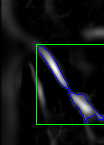

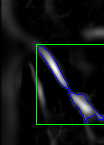


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
(124, 100, 3)
[0, 1, 6, 8, 10, 12, 13, 14, 16, 18, 19, 20, 22, 21, 22, 21, 20, 2, 3, 15, 13, 12, 10, 8, 1, 4, 2, 2, 3, 3, 3, 3, 3, 3, 4, 5, 5, 4, 4, 4, 4, 1]


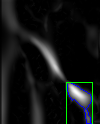

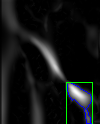


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
(148, 106, 3)
[0, 2, 2, 2, 1, 2, 2, 2, 2, 1, 5, 10, 11, 12, 13, 13, 14, 14, 15, 15, 15, 16, 16, 15, 16, 16, 16, 16, 15, 16, 15, 15, 15, 14, 15, 15, 15, 15, 16, 16, 14, 12, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 8, 8, 7, 7, 6, 7, 6, 8, 9, 9, 9, 10, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 13, 13, 14, 14, 14, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10, 10, 22, 22, 23, 23, 23, 23, 23, 23, 1]


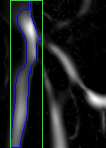

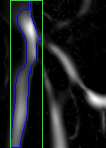


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
(143, 102, 3)
[0, 6, 52, 51, 10, 11, 11, 11, 12, 12, 12, 12, 11, 12, 12, 12, 11, 11, 10, 11, 11, 10, 10, 9, 9, 9, 9, 8, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 6, 5, 1, 3, 3, 3, 3, 5, 9, 12, 13, 14, 13, 13, 13, 13, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 11, 10, 7, 3, 2, 1, 1, 0]


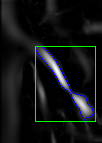

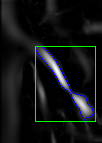


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
(131, 104, 3)
[0, 1, 1, 1, 10, 12, 12, 13, 13, 13, 12, 13, 13, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10, 11, 10, 10, 10, 10, 9, 10, 9, 9, 9, 8, 8, 8, 1, 1, 1, 1, 0]


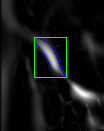

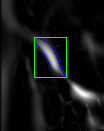


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
(148, 101, 3)
[0, 4, 6, 7, 9, 9, 9, 6, 6, 6, 5, 5, 5, 12, 12, 12, 12, 12, 12, 11, 12, 11, 11, 10, 10, 9, 9, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 5, 5, 4, 4, 1, 0]


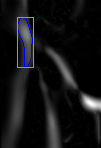

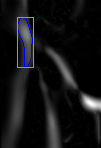


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
(134, 98, 3)
[0, 87, 88, 88, 87, 87, 86, 85, 85, 11, 11, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 13, 14, 14, 13, 14, 14, 14, 14, 14, 1, 1, 1, 1, 1, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 13, 13, 13, 12, 1, 10, 10, 11, 10, 9, 9, 8, 7, 8, 7, 7, 7, 6, 7, 6, 7, 6, 7, 7, 6, 7, 6, 6, 5, 1, 3, 1, 1, 26, 1, 1, 1, 3, 5, 6, 7, 8, 7, 7, 7, 8, 8, 1, 12, 12, 12, 1, 9, 7, 1, 0]


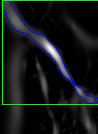

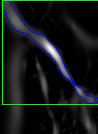


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
(144, 97, 3)
[0, 1, 4, 5, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 8, 7, 7, 7, 7, 8, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 1, 1, 1, 1, 0]


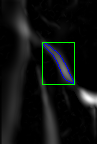

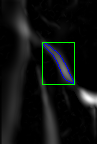


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
(150, 109, 3)
[0, 1, 1, 62, 9, 10, 11, 11, 12, 12, 11, 11, 12, 12, 11, 12, 11, 11, 11, 11, 11, 11, 11, 10, 11, 10, 10, 9, 10, 9, 9, 9, 9, 8, 8, 8, 8, 7, 7, 7, 6, 6, 6, 1, 4, 4, 4, 5, 6, 10, 14, 16, 15, 15, 16, 17, 17, 19, 20, 21, 21, 1, 1, 19, 18, 18, 15, 13, 12, 10, 9, 8, 7, 6, 4, 4, 4, 4, 4, 5, 6, 6, 7, 1, 4, 4, 4, 5, 4, 5, 5, 4, 4, 1, 0]


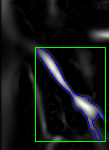

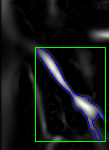


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
(133, 100, 3)
[0, 87, 87, 87, 87, 86, 86, 86, 85, 85, 84, 84, 10, 10, 10, 10, 10, 10, 11, 10, 11, 11, 11, 11, 12, 12, 12, 12, 12, 1, 1, 1, 1, 9, 10, 11, 12, 13, 14, 14, 14, 14, 14, 1, 13, 14, 13, 13, 13, 13, 13, 12, 12, 12, 11, 12, 12, 11, 11, 10, 10, 9, 9, 9, 9, 8, 8, 8, 7, 7, 7, 7, 7, 6, 7, 6, 7, 6, 6, 1, 4, 4, 4, 3, 3, 3, 4, 5, 7, 11, 11, 10, 10, 10, 10, 11, 1, 12, 13, 13, 14, 14, 14, 6, 6, 5, 5, 5, 3, 1, 0]


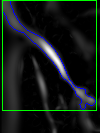

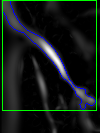

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
    if detection.prediction:
        image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
        #cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
        print()
        print("Ground Truth: (GREEN)")
        print(detection.ground_truth)
        print("Prediction: (BLUE)")
        print(detection.prediction)
        #cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

        # compute the intersection over union and display it
        iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
        cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print()
        print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
        # compute the dice coefficient and display it
        dice = bb_dice(detection.ground_truth, detection.prediction)
        cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

        print()

        # show the output image
        #cv2_imshow(image)
        x1, y1, x2, y2 = detection.prediction
        cropped_image = image[y1:y2, x1:x2]
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

        from skimage import exposure
        from skimage.filters import frangi
        from google.colab.patches import cv2_imshow
        # Enhance the contrast using histogram equalization
        enhanced_image = exposure.equalize_hist(gray_image)

        # Apply the Frangi filter
        frangi_image = frangi(enhanced_image)

        # Normalize the output to the range [0, 255]
        frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
        print("Frangi image")
        #cv2_imshow(frangi_image)

        # Check if the frangi_image is a grayscale image
        if len(frangi_image.shape) == 2:
          # Convert the frangi image to a 3-channel image
          frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

        # Convert the frangi image to grayscale
        gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

        # apply binary thresholding
        ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

        # Create the sharpening kernel
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

        # Sharpen the image
        sharpened_image = cv2.filter2D(thresh, -1, kernel)

        thresh = sharpened_image
        #cv2_imshow(thresh)

        # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
        contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

        # draw contours on the original image
        image_copy = frangi_image.copy()


        """
        Now let's try with `cv2.CHAIN_APPROX_SIMPLE`
        """
        # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
        contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


        sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


        largest_item= sorted_contours[0]
        largest2 = sorted_contours[1]
        largest3 = sorted_contours[2]


        cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
        #cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
        #cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)

        x = int(wh0[0]) - int(point0[0])
        y = int(wh0[1]) + int(point0[1])

        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        # Iterate over all contours
        for i in range(min(1, len(contours))):
            # Get the bounding box around the contour
            x, y, w, h = cv2.boundingRect(contours[i])

            # Draw the bounding box around the contour
            cv2.rectangle(image_copy, (x, y), (x + w, y + h), (0, 255, 0), 1)

            # Extract pixel colors within the bounding box
            min_x = x
            max_x = x + w
            min_y = y
            max_y = y + h
            import numpy as np

            # Extract pixel colors from left to right within the bounding box
            colors = []
            count = []
            flag = 0
            blue_pixel_count = 0
            arr1 = np.array([255,0,0])
            print(image_copy.shape)
            for y_coord in range(min_y, min(max_y + 1, image_copy.shape[0])):
                flag = 0
                blue_pixel_count = 0
                for x_coord in range(min_x, min(max_x + 1, image_copy.shape[1])):
                    #cv2.circle(image_copy, (x_coord, y_coord), 0, (120, 205, 255), 1)
                    pixel_color = image_copy[y_coord, x_coord]
                    if np.array_equal(arr1, pixel_color):
                        flag += 1
                    if flag == 1:
                        blue_pixel_count += 1
                    if flag == 2:
                        break
                count.append(blue_pixel_count)
            print(count)



    # https://www.tutorialspoint.com/how-to-find-the-bounding-rectangle-of-an-image-contour-in-opencv-python
        box = cv2.boxPoints(rect0)
        box = np.int0(box)

        box1 = cv2.boxPoints(rect1)
        box1 = np.int0(box1)

        cv2_imshow(image_copy)

        # finding midpoints of 2 corners of rectangle 1
        coordinate1 =(box[2][0], box[2][1])
        coordinate2 = (box[3][0], box[3][1])


        # # Draw the midpoint 1 on the image
        # draw_midpoint_on_image(image_copy, coordinate1, coordinate2)

        # finding midpoints of 2 corners of rectangle 2
        coordinate3 =(box1[0][0], box1[0][1])
        coordinate4 = (box1[1][0], box1[1][1])


        # finding midpoints of 2 corners of rectangle 1
        coordinate5 =(box[0][0], box[0][1])
        coordinate6 = (box[1][0], box[1][1])


        cv2_imshow(image_copy)


        # checking for just image : 14_006_1_0148.bmp:

        midpoint_a = get_midpoint(coordinate1, coordinate2)
        midpoint_b = get_midpoint(coordinate3, coordinate4)

        cv2.line(image_copy, midpoint_a, midpoint_b, (0,255,255), 1) # stent length
        cv2.line(image_copy, coordinate5, coordinate6, (0,255,255), 1) # stent width

        # Calculate the distance
        distance1 = calculate_distance(coordinate5, coordinate6)
        distance = calculate_distance(midpoint_a, midpoint_b)


# Diameter Variation along coronary artery


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
(145, 104, 3)
[3, 5, 7, 9, 9, 10, 11, 12, 12, 12, 12, 11, 12, 12, 11, 12, 11, 11, 12, 11, 12, 11, 11, 11, 11, 10, 11, 10, 11, 10, 10, 10, 10, 9, 10, 9, 9, 10, 9, 9, 8, 7, 6, 3, 3, 38, 3, 3, 4, 6, 8, 15, 17, 17, 17, 16, 17, 19, 18, 17, 17, 17, 17, 16, 16, 17, 17, 10, 18, 19, 14, 12, 3, 3, 14, 4, 19, 20, 20, 20, 2]
38
2


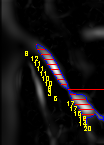


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
(124, 100, 3)
[3, 7, 8, 10, 12, 14, 15, 16, 18, 20, 21, 22, 24, 23, 24, 23, 22, 4, 5, 17, 15, 14, 12, 10, 3, 6, 4, 4, 5, 5, 5, 5, 5, 5, 6, 7, 7, 6, 6, 6, 6, 3]
24
3


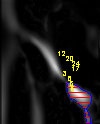


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
(148, 106, 3)
[3, 4, 4, 4, 3, 4, 4, 4, 4, 3, 7, 12, 13, 14, 15, 15, 16, 16, 17, 17, 17, 18, 18, 17, 18, 18, 18, 18, 17, 18, 17, 17, 17, 16, 17, 17, 17, 17, 18, 18, 16, 14, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 11, 10, 10, 9, 9, 8, 9, 8, 10, 11, 11, 4, 4, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 15, 15, 15, 30, 30, 30, 30, 30, 15, 15, 15, 15, 15, 15, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 16, 18, 18, 18, 18, 18, 19, 19, 16, 16, 16, 15, 15, 15, 15, 14, 14, 14, 14, 14, 14, 14, 13, 13, 13, 13, 13, 12, 12, 13, 13, 25, 25, 25, 25, 25, 12, 3]
30
3


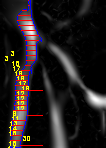


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
(143, 102, 3)
[3, 8, 11, 12, 12, 13, 13, 13, 14, 14, 14, 14, 13, 14, 14, 14, 13, 13, 12, 13, 13, 12, 12, 11, 11, 11, 11, 10, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 9, 8, 7, 3, 5, 5, 5, 5, 7, 11, 14, 15, 16, 15, 15, 15, 15, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 13, 12, 9, 5, 4, 3, 3, 2]
16
2


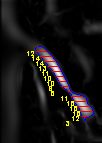


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
(131, 104, 3)
[3, 6, 8, 11, 12, 14, 14, 15, 15, 15, 14, 15, 15, 14, 14, 14, 14, 13, 13, 13, 13, 13, 12, 13, 12, 12, 12, 12, 11, 12, 11, 11, 11, 10, 10, 10, 3, 3, 3, 3, 2]
15
2


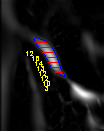


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
(148, 101, 3)
[3, 6, 8, 9, 11, 11, 11, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 13, 14, 13, 13, 12, 12, 11, 11, 10, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 8, 8, 7, 7, 6, 6, 3, 2]
14
2


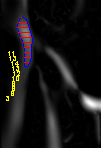


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
(134, 98, 3)
[3, 11, 10, 10, 11, 11, 12, 13, 13, 13, 13, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 15, 16, 16, 15, 16, 16, 16, 16, 16, 3, 3, 3, 3, 3, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 15, 15, 15, 14, 3, 12, 12, 13, 12, 11, 11, 10, 9, 10, 9, 9, 9, 8, 9, 8, 9, 8, 9, 9, 8, 9, 8, 8, 7, 3, 5, 3, 3, 28, 3, 3, 3, 5, 7, 8, 9, 10, 9, 9, 9, 10, 10, 3, 14, 14, 14, 3, 11, 9, 3, 2]
28
2


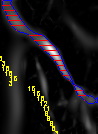


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
(144, 97, 3)
[3, 5, 6, 7, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 10, 9, 9, 9, 9, 10, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 3, 3, 3, 3, 2]
10
2


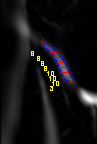


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
(150, 109, 3)
[3, 7, 9, 11, 11, 12, 13, 13, 14, 14, 13, 13, 14, 14, 13, 14, 13, 13, 13, 13, 13, 13, 13, 12, 13, 12, 12, 11, 12, 11, 11, 11, 11, 10, 10, 10, 10, 9, 9, 9, 8, 8, 8, 3, 6, 6, 6, 7, 8, 12, 16, 18, 17, 17, 18, 19, 3, 15, 3, 23, 23, 3, 3, 8, 20, 7, 5, 15, 4, 12, 11, 10, 9, 8, 6, 6, 6, 6, 6, 7, 8, 8, 9, 3, 6, 6, 6, 7, 6, 7, 7, 6, 6, 3, 2]
23
2


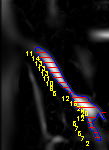


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
(133, 100, 3)
[3, 10, 10, 10, 10, 11, 11, 11, 12, 12, 13, 13, 3, 12, 12, 12, 12, 12, 13, 12, 13, 13, 13, 13, 14, 14, 14, 14, 14, 3, 3, 3, 3, 11, 12, 13, 14, 15, 16, 16, 16, 16, 16, 3, 15, 16, 15, 15, 15, 15, 15, 14, 14, 14, 13, 14, 14, 13, 13, 12, 12, 11, 11, 11, 11, 10, 10, 10, 9, 9, 9, 9, 9, 8, 9, 8, 9, 8, 8, 3, 6, 6, 6, 5, 5, 5, 6, 7, 9, 13, 13, 12, 12, 12, 12, 13, 3, 14, 15, 15, 16, 16, 16, 8, 8, 7, 7, 7, 5, 3, 2]
16
2


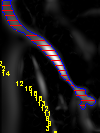

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
    if detection.prediction:
        image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
        #cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
        print()
        print("Ground Truth: (GREEN)")
        print(detection.ground_truth)
        print("Prediction: (BLUE)")
        print(detection.prediction)
        #cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

        # compute the intersection over union and display it
        iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
        cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print()
        print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
        # compute the dice coefficient and display it
        dice = bb_dice(detection.ground_truth, detection.prediction)
        cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

        print()

        # show the output image
        #cv2_imshow(image)
        x1, y1, x2, y2 = detection.prediction
        cropped_image = image[y1:y2, x1:x2]
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

        from skimage import exposure
        from skimage.filters import frangi
        from google.colab.patches import cv2_imshow
        # Enhance the contrast using histogram equalization
        enhanced_image = exposure.equalize_hist(gray_image)

        # Apply the Frangi filter
        frangi_image = frangi(enhanced_image)

        # Normalize the output to the range [0, 255]
        frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
        print("Frangi image")
        #cv2_imshow(frangi_image)

        # Check if the frangi_image is a grayscale image
        if len(frangi_image.shape) == 2:
          # Convert the frangi image to a 3-channel image
          frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

        # Convert the frangi image to grayscale
        gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

        # apply binary thresholding
        ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

        # Create the sharpening kernel
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

        # Sharpen the image
        sharpened_image = cv2.filter2D(thresh, -1, kernel)

        thresh = sharpened_image
        #cv2_imshow(thresh)

        # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
        contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

        # draw contours on the original image
        image_copy = frangi_image.copy()


        """
        Now let's try with `cv2.CHAIN_APPROX_SIMPLE`
        """
        # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
        contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


        sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


        largest_item= sorted_contours[0]
        largest2 = sorted_contours[1]
        largest3 = sorted_contours[2]


        cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
        #cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
        #cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)

        x = int(wh0[0]) - int(point0[0])
        y = int(wh0[1]) + int(point0[1])

        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        # Iterate over all contours
        for i in range(min(1, len(contours))):
            # Get the bounding box around the contour
            x, y, w, h = cv2.boundingRect(contours[i])

            # Draw the bounding box around the contour
            #cv2.rectangle(image_copy, (x, y), (x + w, y + h), (0, 255, 0), 1)

            # Extract pixel colors within the bounding box
            min_x = x
            max_x = x + w
            min_y = y
            max_y = y + h
            import numpy as np

            # Extract pixel colors from left to right within the bounding box
            colors = []
            count = []
            flag = 0
            linecount = 0
            blue_pixel_count = 0
            arr1 = np.array([255,0,0])
            print(image_copy.shape)
            for y_coord in range(min_y, min(max_y + 1, image_copy.shape[0])):
                flag = 0
                blue_pixel_count = 2
                for x_coord in range(min_x, min(max_x + 1, image_copy.shape[1])):
                    pixel_color = image_copy[y_coord, x_coord]
                    if np.array_equal(arr1, pixel_color):
                        flag += 1
                    if flag == 1:
                        blue_pixel_count += 1
                        if ((linecount % 5) == 0):
                          cv2.circle(image_copy, (x_coord, y_coord), 0, (0, 0, 255), 1)
                    if flag == 2:
                        break
                linecount = linecount + 1
                if((linecount % 5 == 0)):
                  text = str(blue_pixel_count)
                  position = (x_coord - 20, linecount + 50)
                  color = (0,255,255)
                  thickness = 1
                  font = cv2.FONT_HERSHEY_SIMPLEX
                  font_scale = 0.20
                  cv2.putText(image_copy, text, position, font, font_scale, color, thickness)

                count.append(blue_pixel_count)
            print(count)
            print(max(count))
            count_without_zero = [c for c in count if c >0]
            minimum = min(count_without_zero)
            print(minimum)

            cv2_imshow(image_copy)




# Severity Percentage


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[494, 392, 598, 537]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.7602
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.8638

Frangi image
(145, 104, 3)
[3, 5, 7, 9, 9, 10, 11, 12, 12, 12, 12, 11, 12, 12, 11, 12, 11, 11, 12, 11, 12, 11, 11, 11, 11, 10, 11, 10, 11, 10, 10, 10, 10, 9, 10, 9, 9, 10, 9, 9, 8, 7, 6, 3, 3, 38, 3, 3, 4, 6, 8, 15, 17, 17, 17, 16, 17, 17, 17, 17, 17, 17, 17, 16, 16, 17, 17, 18, 18, 19, 14, 12, 10, 6, 4, 4, 3, 3, 20, 20, 2]
38
2
Severity ratio: 94.74%


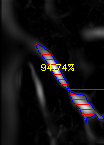


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[477, 409, 577, 533]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8505
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9192

Frangi image
(124, 100, 3)
[3, 7, 8, 10, 12, 14, 15, 16, 18, 20, 21, 22, 24, 23, 24, 23, 22, 4, 5, 17, 15, 14, 12, 10, 3, 6, 4, 4, 5, 5, 5, 5, 5, 5, 6, 7, 7, 6, 6, 6, 6, 3]
24
3
Severity ratio: 87.50%


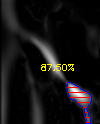


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[455, 401, 561, 549]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.6463
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.7851

Frangi image
(148, 106, 3)
[3, 4, 4, 4, 3, 4, 4, 4, 4, 3, 7, 12, 13, 14, 15, 15, 16, 16, 17, 17, 17, 18, 18, 17, 18, 18, 18, 18, 17, 18, 17, 17, 17, 16, 17, 17, 17, 17, 18, 18, 16, 14, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 11, 10, 10, 9, 9, 8, 9, 8, 10, 11, 11, 11, 12, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 15, 15, 16, 16, 16, 15, 15, 15, 15, 14, 14, 14, 14, 14, 14, 14, 13, 13, 13, 13, 13, 12, 12, 13, 13, 12, 12, 12, 12, 12, 12, 3]
18
3
Severity ratio: 83.33%


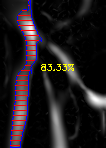


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[492, 396, 594, 539]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.7361
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.8480

Frangi image
(143, 102, 3)
[3, 8, 11, 12, 12, 13, 13, 13, 14, 14, 14, 14, 13, 14, 14, 14, 13, 13, 12, 13, 13, 12, 12, 11, 11, 11, 11, 10, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 9, 8, 7, 3, 5, 5, 5, 5, 7, 11, 14, 15, 16, 15, 15, 15, 15, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 13, 12, 9, 5, 4, 3, 3, 2]
16
2
Severity ratio: 87.50%


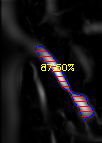


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[482, 404, 586, 535]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.8925
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9432

Frangi image
(131, 104, 3)
[3, 6, 8, 11, 12, 14, 14, 15, 15, 15, 14, 15, 15, 14, 14, 14, 14, 13, 13, 13, 13, 13, 12, 13, 12, 12, 12, 12, 11, 12, 11, 11, 11, 10, 10, 10, 3, 3, 3, 3, 2]
15
2
Severity ratio: 86.67%


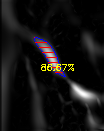


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[461, 400, 562, 548]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.5754
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.7305

Frangi image
(148, 101, 3)
[3, 6, 8, 9, 11, 11, 11, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 13, 14, 13, 13, 12, 12, 11, 11, 10, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 8, 8, 7, 7, 6, 6, 3, 2]
14
2
Severity ratio: 85.71%


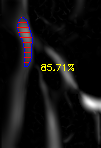


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[487, 416, 585, 550]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.6571
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.7931

Frangi image
(134, 98, 3)
[3, 11, 10, 10, 11, 11, 12, 13, 13, 13, 13, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 15, 16, 16, 15, 16, 16, 16, 16, 16, 3, 3, 3, 3, 3, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 15, 15, 15, 14, 3, 12, 12, 13, 12, 11, 11, 10, 9, 10, 9, 9, 9, 8, 9, 8, 9, 8, 9, 9, 8, 9, 8, 8, 7, 3, 5, 3, 3, 28, 3, 3, 3, 5, 7, 8, 9, 10, 9, 9, 9, 10, 10, 3, 14, 14, 14, 3, 11, 9, 3, 2]
28
2
Severity ratio: 92.86%


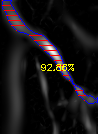


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[464, 406, 561, 550]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.6610
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.7959

Frangi image
(144, 97, 3)
[3, 5, 6, 7, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 10, 9, 9, 9, 9, 10, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 3, 3, 3, 3, 2]
10
2
Severity ratio: 80.00%


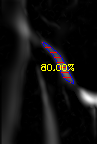


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[489, 390, 598, 540]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.6704
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.8027

Frangi image
(150, 109, 3)
[3, 7, 9, 11, 11, 12, 13, 13, 14, 14, 13, 13, 14, 14, 13, 14, 13, 13, 13, 13, 13, 13, 13, 12, 13, 12, 12, 11, 12, 11, 11, 11, 11, 10, 10, 10, 10, 9, 9, 9, 8, 8, 8, 3, 6, 6, 6, 7, 8, 12, 16, 18, 17, 17, 18, 19, 19, 21, 22, 23, 23, 3, 3, 21, 20, 20, 17, 15, 14, 12, 11, 10, 9, 8, 6, 6, 6, 6, 6, 7, 8, 8, 9, 3, 6, 6, 6, 7, 6, 7, 7, 6, 6, 3, 2]
23
2
Severity ratio: 91.30%


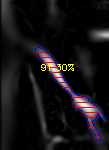


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[489, 412, 589, 545]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7287
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8430

Frangi image
(133, 100, 3)
[3, 10, 10, 10, 10, 11, 11, 11, 12, 12, 13, 13, 3, 12, 12, 12, 12, 12, 13, 12, 13, 13, 13, 13, 14, 14, 14, 14, 14, 3, 3, 3, 3, 11, 12, 13, 14, 15, 16, 16, 16, 16, 16, 3, 15, 16, 15, 15, 15, 15, 15, 14, 14, 14, 13, 14, 14, 13, 13, 12, 12, 11, 11, 11, 11, 10, 10, 10, 9, 9, 9, 9, 9, 8, 9, 8, 9, 8, 8, 3, 6, 6, 6, 5, 5, 5, 6, 7, 9, 13, 13, 12, 12, 12, 12, 13, 3, 14, 15, 15, 16, 16, 16, 8, 8, 7, 7, 7, 5, 3, 2]
16
2
Severity ratio: 87.50%


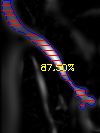

In [ ]:
from google.colab.patches import cv2_imshow

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
    if detection.prediction:
        image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
        #cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
        print()
        print("Ground Truth: (GREEN)")
        print(detection.ground_truth)
        print("Prediction: (BLUE)")
        print(detection.prediction)
        #cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

        # compute the intersection over union and display it
        iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
        cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print()
        print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
        # compute the dice coefficient and display it
        dice = bb_dice(detection.ground_truth, detection.prediction)
        cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

        print()

        # show the output image
        #cv2_imshow(image)
        x1, y1, x2, y2 = detection.prediction
        cropped_image = image[y1:y2, x1:x2]
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

        from skimage import exposure
        from skimage.filters import frangi
        from google.colab.patches import cv2_imshow
        # Enhance the contrast using histogram equalization
        enhanced_image = exposure.equalize_hist(gray_image)

        # Apply the Frangi filter
        frangi_image = frangi(enhanced_image)

        # Normalize the output to the range [0, 255]
        frangi_image = ((frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255).astype(np.uint8)
        print("Frangi image")
        #cv2_imshow(frangi_image)

        # Check if the frangi_image is a grayscale image
        if len(frangi_image.shape) == 2:
          # Convert the frangi image to a 3-channel image
          frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_GRAY2BGR)

        # Convert the frangi image to grayscale
        gray_fimage = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

        # apply binary thresholding
        ret, thresh = cv2.threshold(gray_fimage, 50, 255, cv2.THRESH_BINARY)

        # Create the sharpening kernel
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

        # Sharpen the image
        sharpened_image = cv2.filter2D(thresh, -1, kernel)

        thresh = sharpened_image
        #cv2_imshow(thresh)

        # detect the contours on the binary image using cv2.CHAIN_APPROX_NONE
        contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

        # draw contours on the original image
        image_copy = frangi_image.copy()


        """
        Now let's try with `cv2.CHAIN_APPROX_SIMPLE`
        """
        # detect the contours on the binary image using cv2.ChAIN_APPROX_SIMPLE
        contours1, hierarchy1 = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


        sorted_contours= sorted(contours, key=cv2.contourArea, reverse= True)


        largest_item= sorted_contours[0]
        largest2 = sorted_contours[1]
        largest3 = sorted_contours[2]


        cv2.drawContours(image_copy, largest_item, -1, (255,0,0),1)
        #cv2.drawContours(image_copy, largest2, -1, (255,255,0),1)
        #cv2.drawContours(image_copy, largest3, -1, (1,250,0),1)

        x = int(wh0[0]) - int(point0[0])
        y = int(wh0[1]) + int(point0[1])

        contours = sorted(contours, key=cv2.contourArea, reverse=True)
        # Iterate over all contours
        for i in range(min(1, len(contours))):
            # Get the bounding box around the contour
            x, y, w, h = cv2.boundingRect(contours[i])

            # Draw the bounding box around the contour
            #cv2.rectangle(image_copy, (x, y), (x + w, y + h), (0, 255, 0), 1)

            # Extract pixel colors within the bounding box
            min_x = x
            max_x = x + w
            min_y = y
            max_y = y + h
            import numpy as np

            # Extract pixel colors from left to right within the bounding box
            colors = []
            count = []
            flag = 0
            linecount = 0
            blue_pixel_count = 0
            arr1 = np.array([255,0,0])
            print(image_copy.shape)
            for y_coord in range(min_y, min(max_y + 1, image_copy.shape[0])):
                flag = 0
                blue_pixel_count = 2
                for x_coord in range(min_x, min(max_x + 1, image_copy.shape[1])):
                    pixel_color = image_copy[y_coord, x_coord]
                    if np.array_equal(arr1, pixel_color):
                        flag += 1
                    if flag == 1:
                        blue_pixel_count += 1
                        if ((linecount % 5) == 0):
                          cv2.circle(image_copy, (x_coord, y_coord), 0, (0, 0, 255), 1)
                    if flag == 2:
                        break
                linecount = linecount + 1
                if((linecount % 5 == 0)):
                  text = str(blue_pixel_count)
                  position = (x_coord - 20, linecount + 50)
                  color = (0,255,255)
                  thickness = 1
                  font = cv2.FONT_HERSHEY_SIMPLEX
                  font_scale = 0.16
                  #cv2.putText(image_copy, text, position, font, font_scale, color, thickness)

                count.append(blue_pixel_count)
            print(count)
            maximum = max(count)
            print(maximum)
            count_without_zero = [c for c in count if c >0]
            minimum = min(count_without_zero)
            print(minimum)
            result = 100 * (minimum/maximum)
            sev_ratio = 100 - result
            formatted = "{:.2f}".format(sev_ratio)
            print("Severity ratio: " + str(formatted) + "%")

            text = str(formatted) + "%"
            position = (40, 70)
            # Choose the font and scale
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 0.3

            # Choose the color and thickness of the text
            color = (0, 255, 255)  # BGR
            thickness = 1

            # Add text to the image
            cv2.putText(image_copy, text, position, font, font_scale, color, thickness)

            cv2_imshow(image_copy)


